<a href="https://colab.research.google.com/github/ADavila7/ProyectoIntegrador-MNA/blob/main/Avance3_Equipo11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Maestría en Inteligencia Artificial Aplicada**

## Curso: **Proyecto Integrador**

### Tecnológico de Monterrey

## Actividad Semana 4

### **Actividad 3. Baseline**

Nombres y matrículas de los integrantes del equipo:
* Adrián Alejandro Dávila González - A01039334
* Samuel Emanuel Aguilar García - A00816565

## **Actividades Iniciales**

### **Descripción de Contexto**

El propósito de este Proyecto Integrador, como se ha mencionado en las descripciones de semanas anteriores, consiste en desarrollar un programa que permita detectar si un componente físico de un sistema de rectificación eléctrica se está comportando de manera correcta o incorrecta en base a mediciones de temperatura capturadas por una cámara térmica durante la operación del equipo.

Para llevar a cabo esto, se tiene considerado hacer uso de dos tipos de modelos de aprendizaje:
*   **Modelo de Aprendizaje Profundo, específicamente un modelo de visión computacional.**
*   **Modelo de Aprendizaje No Supervisado, específicamente un modelo de agrupamiento.**

El uso de las técnicas mencionadas es debido a que se busca realizar la detección de componentes de interés en las imágenes capturadas por el equipo de medición, por lo cual se tiene en cuenta el modelo de visión, y la detección de anomalías en base al comportamiento detectado gracias a las mediciones de temperatura en estos elementos, por lo cual se tiene en cuenta el modelo de agrupamiento.


Al ser un entrenamiento basado en equipo propio, creamos una base de datos de fotografías y datos utilizando una cámara termográfica. Esta cámara nos proporciona distintos tipos de imágenes (como luz normal, térmica y mixta), así como un arreglo de las temperaturas dentro de la imagen. Actualmente, contamos con 382 fotografías (cada una con sus distintos filtros y mapa de temperaturas). Esta base de datos es inicial, ya que buscamos incrementarla a lo largo del proyecto para poder obtener un modelo con mayor precisión. El procesamiento que hemos aplicado a estas variables se describirá más adelante.

### **Referencias**

*   Redmon, J., Divvala, S., Girshick, R., & Farhadi, A. (2016). You only look once: Unified, real-time object detection. IEEE Conference on Computer Vision and Pattern Recognition (CVPR).
*   Jocher, G., et al. (2022). YOLOv5: A guide to object detection. Ultralytics.
*   Roboflow Team. (2022). How to Improve your Computer Vision Model. Roboflow Blog. https://blog.roboflow.com/model-best-practices/
*   sobel — SciPy v1.14.1 Manual. (n.d.). https://docs.scipy.org/doc/scipy/reference/generated/scipy.ndimage.sobel.html
*   Drake, A. (2024, March 26). Unveiling the potential of histogram of Oriented gradients (HOG) in computer vision. Comet. https://www.comet.com/site/blog/unveiling-the-potential-of-histogram-of-oriented-gradients-hog-in-computer-vision/
*   Mittal, K. (2024, March 12). A gentle introduction into the histogram of oriented gradients. Medium. https://medium.com/analytics-vidhya/a-gentle-introduction-into-the-histogram-of-oriented-gradients-fdee9ed8f2aa
*   Tyagi, M. (2024, April 2). Histogram of Oriented Gradients: An Overview. Built In. https://builtin.com/articles/histogram-of-oriented-gradients
*   Effect of (not) standardizing variables in k-means clustering - Dmitrijs Kass’ blog. (2019, October 22). https://dmitrijskass.netlify.app/2019/10/22/effect-of-not-standardizing-variables-in-k-means-clustering/
*   Meritshot. (2023, August 22). Standardization v/s Normalization - Meritshot - Medium. Medium. https://medium.com/@meritshot/standardization-v-s-normalization-6f93225fbd84
*   
Javali, M. (2023, May 4). 10 ways to extract features from an image - Mohit Javali - Medium. Medium. https://medium.com/@mohitjavali/10-ways-to-extract-features-from-an-image-f44c8e9b0fbf
*   Are mean normalization and feature scaling needed for k-means clustering? (n.d.). Cross Validated. https://stats.stackexchange.com/questions/21222/are-mean-normalization-and-feature-scaling-needed-for-k-means-clustering
*   Feature Detectors - Sobel Edge Detector. (n.d.). https://homepages.inf.ed.ac.uk/rbf/HIPR2/sobel.htm
*   Virmani, D., Taneja, S., & Malhotra, G. (2015, March 3). Normalization based K means Clustering Algorithm. arXiv.org. https://arxiv.org/abs/1503.00900
*   Jamshed, M., Parvin, S., & Akter, S. (2015). Significant HOG-Histogram of oriented gradient feature selection for human detection. International Journal of Computer Applications (0975 – 8887), 132(17). https://citeseerx.ist.psu.edu/document?repid=rep1&type=pdf&doi=0397e6e40e3a85177e70beae70d454dbafed2b5c

### **Importado de Librerías a Utilizar**

In [ ]:
# Montaje de Libreta en Entorno de Google Collaboratory.
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Importado de Librerías.
import os
import pandas as pd
import numpy as np
import seaborn as sns
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mpl_toolkits.mplot3d import Axes3D
from scipy.ndimage import sobel
from scipy.ndimage import zoom
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# Definición de Ruta en Directorios.
Main_Dir= "/content/drive/MyDrive/Maestría/Sexto Trimestre/Proyecto Integrador/Semana 4"
Temp_Dir = os.path.join(Main_Dir, "Mediciones de Temperatura")
IR_Dir = os.path.join(Main_Dir, "Filtro Infrarrojo")
PIP_Dir = os.path.join(Main_Dir, "Filtro Superpuesto")
VL_Dir = os.path.join(Main_Dir, "Luz Visible")
ImData_Dir = os.path.join(Main_Dir, "Dataset Imágenes")
os.chdir(Main_Dir)

# **Modelos de Aprendizaje Profundo**

Para los modelos de aprendizaje profundo que estamos utilizando, los datos de entrada son imágenes, lo que hace que el enfoque tradicional de ingeniería de características sea menos relevante en comparación con otros modelos de aprendizaje automático que trabajan con variables categóricas o numéricas. En lugar de transformar o escalar las variables de entrada, como es común en otros enfoques, los modelos de visión por computadora como YOLO aprenden automáticamente las características directamente a partir de los datos de imagen.

Desde su introducción por Redmon et al. (2016), los modelos YOLO no requieren una ingeniería de características manual. En lugar de definir qué características extraer (como bordes o texturas), YOLO procesa la imagen completa en una sola pasada por la red neuronal, lo que le permite identificar automáticamente las características clave para la detección de objetos en tiempo real. Este enfoque es más eficiente, eliminando la necesidad de preprocesamiento exhaustivo y la manipulación manual de características que suelen aplicarse en otros métodos.

Sin embargo, este proceso automático depende en gran medida de un etiquetado preciso y un filtrado adecuado de las imágenes. La calidad del etiquetado, es decir, anotaciones precisas y bien alineadas con los objetos en las imágenes, es fundamental para que el modelo aprenda a identificar correctamente los objetos. Eliminar imágenes borrosas o mal etiquetadas es crucial para que el aprendizaje sea efectivo. En este sentido, la ingeniería de características tradicional se reemplaza por la tarea de asegurar una correcta organización y limpieza del conjunto de datos. Si las imágenes o las etiquetas no son de buena calidad, el rendimiento del modelo puede verse seriamente afectado, lo que subraya la importancia de contar con datos bien estructurados desde el principio (Jocher et al., 2022).

En nuestro caso, utilizamos Roboflow para revisar y filtrar cada una de las imágenes, eliminando aquellas que estaban demasiado borrosas o no eran relevantes. Luego, de manera manual, seleccionamos las regiones correspondientes a los distintos componentes que queríamos identificar, como Diodo/SCR, Fusible, Snubber y Cables.

Roboflow permitió que cada componente en las imágenes fuera etiquetado con precisión, generando automáticamente una base de datos con las coordenadas exactas de las anotaciones que realizamos. Esta base de datos incluye tanto las imágenes como las etiquetas asociadas, que luego son utilizadas directamente en los modelos de visión por computadora para entrenar el algoritmo en la detección de estos componentes específicos. La plataforma agiliza este proceso al integrar el preprocesamiento y la gestión de datos en una única herramienta, facilitando que las imágenes etiquetadas estén listas para su uso en los modelos (Roboflow Team, 2022).

A continuación se presentaran ejemplos de las imágenes que contabamos para nuestra base de datos, así como el etiquetado y resultado final de nuestros datos.

### **Ejemplos de Imágenes con Filtro Infrarrojo**

**Filtro Infrarrojo**

A continuación, se muestran algunas imágenes con filtro infrarrojo con las que se cuenta en el dataset.

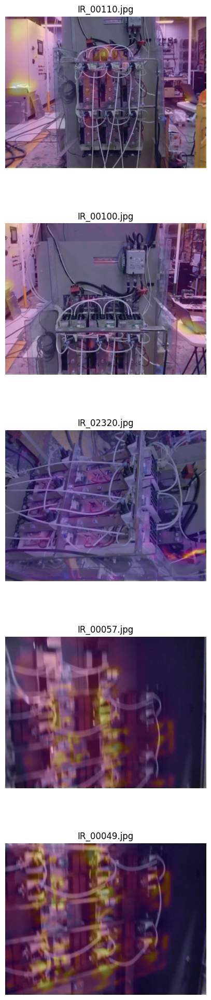

In [ ]:
# Impresión de 5 Imágenes de la carpeta "Filtro Infrarrojo"

# Lista con los nombres de las imágenes en la carpeta
image_files = [f for f in os.listdir(IR_Dir) if os.path.isfile(os.path.join(IR_Dir, f))]

# Selección de 5 imágenes aleatoriamente
random_images = random.sample(image_files, 5)

# Ploteo de las imágenes seleccionadas verticalmente
plt.figure(figsize=(5, 25))  # Ajuste de tamaño de la figura para imágenes verticales

for i, image_file in enumerate(random_images):
    img = mpimg.imread(os.path.join(IR_Dir, image_file))
    plt.subplot(5, 1, i + 1)  # 5 filas, 1 columna
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')

plt.show()

### **Ejemplos de Imágenes con Filtro Superpuesto**



**Filtro Superpuesto**

A continuación, se muestran algunas imágenes con filtro infrarrojo superpuesto en las imágenes de luz visible con las que se cuenta en el dataset.

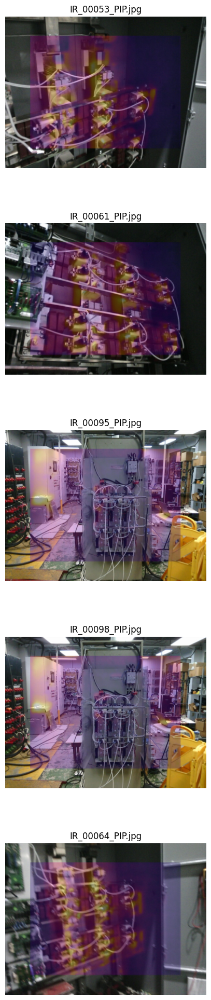

In [ ]:
# Impresión de 5 Imágenes de la carpeta "Filtro Superpuesto"

# Lista con los nombres de las imágenes en la carpeta
image_files = [f for f in os.listdir(PIP_Dir) if os.path.isfile(os.path.join(PIP_Dir, f))]

# Selección de 5 imágenes aleatoriamente
random_images = random.sample(image_files, 5)

# Ploteo de las imágenes seleccionadas verticalmente
plt.figure(figsize=(5, 25))  # Ajuste de tamaño de la figura para imágenes verticales

for i, image_file in enumerate(random_images):
    img = mpimg.imread(os.path.join(PIP_Dir, image_file))
    plt.subplot(5, 1, i + 1)  # 5 filas, 1 columna
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')

plt.show()

### **Ejemplos de Imágenes con Luz Visible**



**Luz Visible**

A continuación, se muestran algunas imágenes de luz visible con las que se cuenta en el dataset.

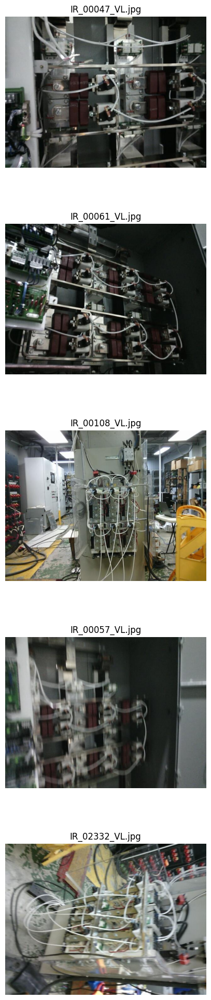

In [ ]:
# Impresión de 5 Imágenes de la carpeta "Luz Visible"

# Lista con los nombres de las imágenes en la carpeta
image_files = [f for f in os.listdir(VL_Dir) if os.path.isfile(os.path.join(VL_Dir, f))]

# Selección de 5 imágenes aleatoriamente
random_images = random.sample(image_files, 5)

# Ploteo de las imágenes seleccionadas verticalmente
plt.figure(figsize=(5, 25))  # Ajuste de tamaño de la figura para imágenes verticales

for i, image_file in enumerate(random_images):
    img = mpimg.imread(os.path.join(VL_Dir, image_file))
    plt.subplot(5, 1, i + 1)  # 5 filas, 1 columna
    plt.imshow(img)
    plt.title(image_file)
    plt.axis('off')

plt.show()

## **Etiquetado de imágenes**

Dentro de la aplicación Roboflow, se importaron todas las imágenes que se capturaron del equipo para su etiquetado.

En esta plataforma, cada imagen fue revisada y se eliminaron aquellas que estaban borrosas o que no contenían elementos relevantes para etiquetar.

Acto siguiente se definieron los componentes, estableciendo regiones específicas para cada uno dentro de las imágenes. Además de esto, la plataforma brinda la posibilidad de etiquetar múltiples componentes de diferentes tipos en una misma imagen.

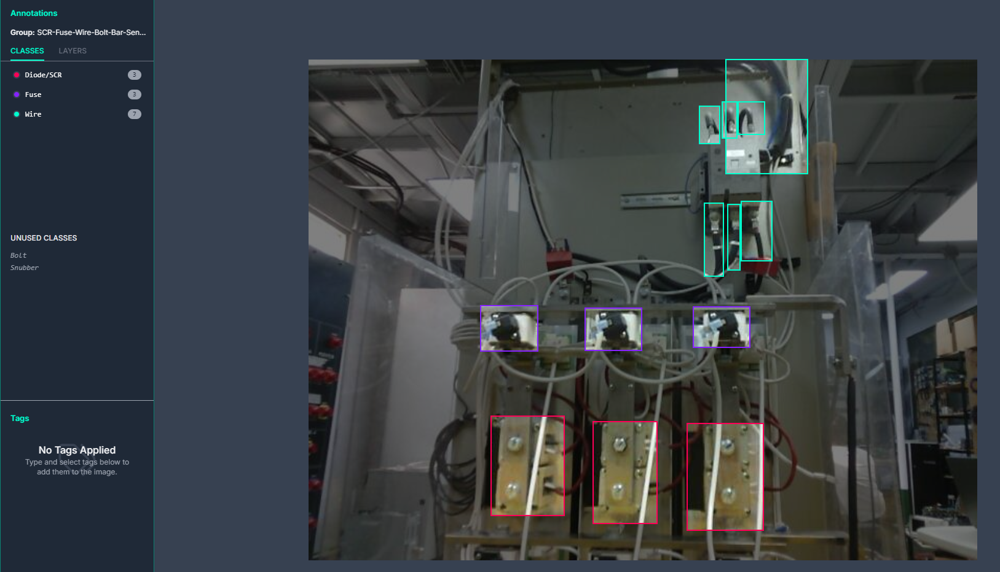

Así fue como se creó la base de datos ya etiquetada, a la cual se le buscará incrementar en tamaño para el entrenamiento y optimización de los modelos de visión a utilizar.

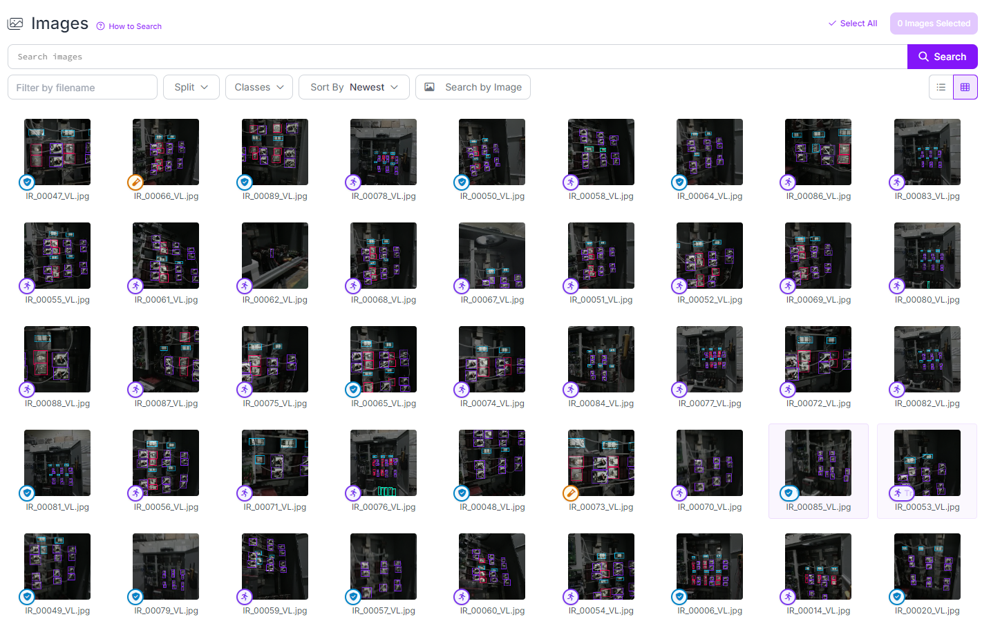

Una de las principales ventajas de esta aplicación es que prepara los datos en el formato que requieren los modelos que vamos a comparar. Este conjunto de datos incluye tanto las imágenes como las posiciones de las etiquetas en cada una de ellas.

In [ ]:
# Impresión del contenido de los archivos de lectura con la información del dataset

# Nombre del archivo de texto correspondiente al archivo de RoboFlow
file_RD1 = 'README.roboflow.txt'

# Construcción de ruta hacia el archivo
file_path_RD1 = os.path.join(ImData_Dir, file_RD1)

# Apertura y lectura del archivo
with open(file_path_RD1, 'r') as file:
    content_RD1 = file.read()
    print(content_RD1)


Thermal Region and Components - v1 2024-09-30 2:08am

This dataset was exported via roboflow.com on September 30, 2024 at 2:08 AM GMT

Roboflow is an end-to-end computer vision platform that helps you
* collaborate with your team on computer vision projects
* collect & organize images
* understand and search unstructured image data
* annotate, and create datasets
* export, train, and deploy computer vision models
* use active learning to improve your dataset over time

For state of the art Computer Vision training notebooks you can use with this dataset,
visit https://github.com/roboflow/notebooks

To find over 100k other datasets and pre-trained models, visit https://universe.roboflow.com

The dataset includes 382 images.
SCR-Fuse-Wire-Bolt-Bar-Sensor are annotated in YOLOv8 format.

The following pre-processing was applied to each image:
* Auto-orientation of pixel data (with EXIF-orientation stripping)
* Resize to 640x640 (Stretch)

No image augmentation techniques were applied.




In [ ]:
# Impresión del contenido de los archivos de lectura con la información del dataset

# Nombre del archivo de texto correspondiente al archivo del Dataset
file_RD2 = 'README.dataset.txt'

# Construcción de ruta hacia el archivo
file_path_RD2 = os.path.join(ImData_Dir, file_RD2)

# Apertura y lectura del archivo
with open(file_path_RD2, 'r') as file:
    content_RD2 = file.read()
    print(content_RD2)

# Thermal Region and Components > 2024-09-30 2:08am
https://universe.roboflow.com/adrians-workspace-sghcv/thermal-region-and-components

Provided by a Roboflow user
License: CC BY 4.0




# **Datos para Modelos de Aprendizaje No Supervisado**

Además de las imágenes previamente mencionadas para el modelo de visión computacional, se cuentan con archivos .csv que contienen las mediciones de temperatura obtenidas por los diversos sensores de la cámara, correspondientes a cada uno de los pixeles de los filtros mostrados en el apartado anterior.

Estos archivos, a los cuáles se les había hecho previamente un primer análisis exploratorio, fueron sujetos al proceso de ingeniería de características que se muestra a continuación.

### **Apertura y Lectura de Archivos**

Se aplicaron varias de las técnicas de la semana anterior en un archivo de ejemplo para obtener un dataframe con el cual se pudiera trabajar para corroborar el efecto de diferentes técnicas de ingeniería de características, las cuales puedan ser utilizadas sobre el listado de archivos general.

In [ ]:
# Procesamiento de archivos durante la apertura

# Procesos a aplicar a los archivos .csv
def process_df(df):

  # Removido de primeras dos filas debido a que contienen información irrelevante
  df= df.drop([0, 1])

  # Removido de título en el header y separación de datos a través de comas
  df = df['All temperatures in °C.'].str.split(',', expand=True)

  # Conversión a formato numérico de los datos en el dataframe
  df = df.apply(pd.to_numeric, errors='coerce')

  # Revisión por si existen valores "NaN" y removido de los mismos si son encontrados
  if df.isna().any().any():
    df = df.dropna(axis=1)

  # Eliminado de primera columna, debido a que contiene los índices de las filas
  df = df.drop([0], axis=1)

  # Reseteo de los índices en los dataframes
  df.reset_index(drop=True, inplace=True)

  return df

In [ ]:
# Generación de dataframe de ejemplo e impresión de algunas filas utilizando la función anterior
os.chdir(Temp_Dir)
df_examp = pd.read_csv('IR_00046.csv', encoding='utf-16', sep='\t')

# Ejecución de Función de Procesamiento para el archivo
df_examp = process_df(df_examp)

# Impresión de algunas filas del dataframe de ejemplo
df_examp

,1,2,3,4,5,6,7,8,9,10,...,111,112,113,114,115,116,117,118,119,120
0,37.3,37.1,36.9,36.4,34.7,33.2,32.5,32.4,32.4,32.2,...,31.4,31.3,31.2,31.1,31.2,31.2,31.2,31.0,30.1,31.2
1,36.8,36.7,36.6,36.0,34.5,33.3,32.5,32.4,32.4,32.3,...,31.5,31.5,31.4,31.4,31.4,31.5,31.4,31.2,31.3,31.7
2,36.0,36.6,36.6,36.4,34.6,33.4,32.6,32.4,32.5,32.5,...,31.7,31.6,31.5,31.5,31.6,31.7,31.6,31.5,31.5,31.6
3,37.2,37.5,38.3,37.7,34.8,33.2,32.4,32.5,33.0,33.0,...,31.8,31.7,31.6,31.6,31.6,31.7,31.5,31.5,31.4,31.4
4,38.0,38.4,38.6,38.0,34.7,33.0,32.4,32.9,33.5,33.5,...,31.9,31.7,31.7,31.7,31.7,31.5,31.4,31.4,31.3,31.3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,31.7,31.6,31.6,32.3,34.0,35.6,36.7,37.3,37.3,36.2,...,34.9,33.2,32.4,31.7,31.5,31.3,31.1,31.0,30.9,31.4
86,32.3,32.6,32.6,33.5,34.8,36.4,37.7,38.2,38.0,36.7,...,33.7,32.6,32.1,31.6,31.3,31.2,31.0,30.9,30.8,31.5
87,32.9,33.6,33.9,34.3,35.2,36.6,38.0,38.6,38.2,36.9,...,33.2,32.4,31.8,31.4,31.3,31.1,31.0,30.9,31.0,31.6
88,33.6,34.3,34.6,34.9,35.6,36.8,38.1,38.9,38.6,37.3,...,32.6,31.9,31.5,31.2,31.3,31.2,31.1,31.1,31.0,31.6


In [ ]:
# Impresión de datos estadísticos descriptivos
print(f"Descripción Estadística de los Datos del DataFrame:\n {df_examp.describe()}"+ "\n")

Descripción Estadística de los Datos del DataFrame:
              1          2          3          4          5          6    \
count  90.000000  90.000000  90.000000  90.000000  90.000000  90.000000   
mean   36.647778  36.855556  36.802222  36.376667  35.108889  34.485556   
std     3.317107   3.109865   2.887010   2.388881   1.435164   1.361473   
min    31.200000  31.000000  31.100000  31.400000  31.600000  31.800000   
25%    33.425000  33.750000  33.900000  34.300000  34.000000  33.400000   
50%    37.300000  37.600000  37.400000  36.450000  35.000000  34.200000   
75%    39.450000  39.275000  39.100000  38.500000  36.150000  35.000000   
max    41.600000  41.500000  41.100000  40.400000  38.300000  38.100000   

             7          8          9          10   ...        111        112  \
count  90.000000  90.000000  90.000000  90.000000  ...  90.000000  90.000000   
mean   34.548889  35.386667  36.363333  37.705556  ...  35.171111  34.963333   
std     1.480149   2.597847   3

In [ ]:
# Aplanado del Dataframe a una Serie de 1D y conversión a una serie de Pandas
flattened_data_ex = df_examp.values.flatten()
flattened_series_ex = pd.Series(flattened_data_ex)

# Cálculo del máximo, mínimo, promedio, desviación estándar, asímetria y curtosis de las Temperaturas Medidas
max_value_ex = df_examp.max().max()  # Valor Máximo en el DataFrame
min_value_ex = df_examp.min().min()  # Valor Mínimo en el DataFrame
mean_value_ex = df_examp.mean().mean()  # Valor Promedio en el DataFrame
std_dev_ex = df_examp.std().mean()  # Desviación Estándar en el DataFrame
skewness_ex = flattened_series_ex.skew() # Asimetría en el DataFrame
kurtosis_ex = flattened_series_ex.kurt() # Curtosis en el DataFrame

# Impresión de Resultados
print(f"Valor Máximo: {max_value_ex}"+ " °C")
print(f"Valor Mínimo: {min_value_ex}"+ " °C")
print(f"Valor Promedio: {mean_value_ex:.2f}"+ " °C")
print(f"Desviación Estándar: {std_dev_ex:.2f}")
print(f"Asimetría: {skewness_ex:.2f}")
print(f"Curtosis: {kurtosis_ex:.2f}")

Valor Máximo: 49.9 °C
Valor Mínimo: 30.1 °C
Valor Promedio: 35.74 °C
Desviación Estándar: 2.36
Asimetría: 1.17
Curtosis: 1.20


Esta información permite tener una idea simple con relación al comportamiento de los datos con los que se cuentan en los archivos que tienen las mediciones de temperatura. Además de visualizarlo en un solo archivo, se volvieron a ejecutar algunas de las celdas de la entrega anterior, preparando las funciones para trabajar con los datos.

#### **Procesamiento Previamente Generado**

In [ ]:
# Inicialización de una lista vacía para guardar los DataFrames procesados
processed_dataframes = []

In [ ]:
# Apertura de los archivos .csv en el folder Medición de Temperaturas

# Iteración a través de los archivos dentro del folder
for filename in os.listdir(Temp_Dir):
    if filename.endswith('.csv'):
        file_path = os.path.join(Temp_Dir, filename)

        # Lectura de cada archivo .csv en un DataFrame
        df = pd.read_csv(file_path, encoding='utf-16', sep='\t')

        # Procesamiento del DataFrame
        processed_df = process_df(df)

        # Añadido del Dataframe a la lista de archivos procesados
        processed_dataframes.append(processed_df)

In [ ]:
# Impresión de datos estadísticos descriptivos, forma y los tipos de datos de los primeros 5 Dataframes procesados

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Impresión de datos estadísticos descriptivos
    print(f"Descripción Estadística de los Datos del DataFrame:\n {df.describe()}"+ "\n")

    # Impresión de la forma del Dataframe y el conteo de la cantidad de pixeles por cada dimensión
    shape = df.shape
    print(f"Tamaño del DataFrame: {shape}")
    print(f"Cantidad de Pixeles en Dimensión Horizontal: {shape[1]}" + " px")
    print(f"Cantidad de Pixeles en Dimensión Vertical: {shape[0]}"+ " px\n")

    # Comprobación de los Tipos de Dato dentro del Dataframe
    print(f"Tipo de Dato en Eje X: {df.columns.dtype}")
    print(f"Tipo de Dato en Eje Y: {df.index.dtype}")
    print(f"Tipo de Dato en Eje Z: {df.values.dtype}")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

DataFrame 1:

Descripción Estadística de los Datos del DataFrame:
              1          2          3          4          5          6    \
count  90.000000  90.000000  90.000000  90.000000  90.000000  90.000000   
mean   23.961111  23.883333  23.877778  23.925556  23.992222  23.986667   
std     0.594865   0.563546   0.549725   0.551109   0.556116   0.519334   
min    23.200000  23.300000  23.300000  23.300000  23.300000  23.300000   
25%    23.500000  23.500000  23.500000  23.500000  23.525000  23.600000   
50%    23.850000  23.600000  23.700000  23.700000  23.800000  23.750000   
75%    24.200000  24.100000  24.200000  24.200000  24.275000  24.200000   
max    26.100000  25.500000  25.400000  25.500000  25.600000  25.500000   

             7          8          9          10   ...        111        112  \
count  90.000000  90.000000  90.000000  90.000000  ...  90.000000  90.000000   
mean   23.978889  23.984444  24.042222  24.071111  ...  24.826667  24.922222   
std     0.530527 

In [ ]:
# Impresión de estadísticas principales de los primeros 5 Dataframes procesados

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Aplanado del Dataframe a una Serie de 1D y conversión a una serie de Pandas
    flattened_data = df.values.flatten()
    flattened_series = pd.Series(flattened_data)

    # Cálculo del máximo, mínimo, promedio, desviación estándar, asímetria y curtosis de las Temperaturas Medidas
    max_value = df.max().max()  # Valor Máximo en el DataFrame
    min_value = df.min().min()  # Valor Mínimo en el DataFrame
    mean_value = df.mean().mean()  # Valor Promedio en el DataFrame
    std_dev = df.std().mean()  # Desviación Estándar en el DataFrame
    skewness = flattened_series.skew() # Asimetría en el DataFrame
    kurtosis = flattened_series.kurt() # Curtosis en el DataFrame

    # Impresión de Resultados
    print(f"Valor Máximo: {max_value}"+ " °C")
    print(f"Valor Mínimo: {min_value}"+ " °C")
    print(f"Valor Promedio: {mean_value:.2f}"+ " °C")
    print(f"Desviación Estándar: {std_dev:.2f}")
    print(f"Asimetría: {skewness:.2f}")
    print(f"Curtosis: {kurtosis:.2f}")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

DataFrame 1:

Valor Máximo: 47.3 °C
Valor Mínimo: 23.0 °C
Valor Promedio: 24.77 °C
Desviación Estándar: 1.09
Asimetría: 6.13
Curtosis: 74.61


DataFrame 2:

Valor Máximo: 29.9 °C
Valor Mínimo: 21.4 °C
Valor Promedio: 22.97 °C
Desviación Estándar: 0.70
Asimetría: 1.65
Curtosis: 3.72


DataFrame 3:

Valor Máximo: 46.7 °C
Valor Mínimo: 31.6 °C
Valor Promedio: 34.95 °C
Desviación Estándar: 1.67
Asimetría: 1.28
Curtosis: 1.24


DataFrame 4:

Valor Máximo: 47.7 °C
Valor Mínimo: 31.2 °C
Valor Promedio: 35.44 °C
Desviación Estándar: 1.49
Asimetría: 0.85
Curtosis: 0.69


DataFrame 5:

Valor Máximo: 47.5 °C
Valor Mínimo: 21.9 °C
Valor Promedio: 24.11 °C
Desviación Estándar: 1.12
Asimetría: 6.40
Curtosis: 78.08




In [ ]:
# Inicialización de listas vacías para guardar los valores de los DataFrames que pertenecen a los ejes de las gráficas
X_list = []
Y_list = []
Z_list = []

In [ ]:
# Iteración a través de los dataframes procesados
for df in processed_dataframes:
  # Creación de los vectores del grid (X,Y) basado en las columnas e índices del DataFrame, con una conversión de tipos de datos incluida.
  # Esta conversión se considera para poder hacer uso del grid correctamente al intentar graficarlo.
  X, Y = np.meshgrid(df.columns.astype(float), df.index.astype(float))

  # Creación de Z, correspondiente a los valores de temperatura en el DataFrame.
  Z = df.values

  # Añadido de los vectores a la lista de vectores para graficado
  X_list.append(X)
  Y_list.append(Y)
  Z_list.append(Z)

In [ ]:
# Definición de Función para visualizar datos en 2D

def Surf2D(df,X,Y,Z):
    # Creación de un contorno relleno para graficar el Dataframe de dos dimensiones.
    # Se toma en cuenta la escala de colores "Inferno" nuevamente.
    plt.figure(figsize=(8, 6))
    plt.contourf(X, Y, Z, cmap='inferno')

    # Añadido de una barra de color, que representa la escala de temperatura detectada.
    plt.colorbar()

    # Ajustado de los límites de la barra de colores según los valores mínimos y máximos del Dataframe.
    plt.clim(df.min().min(), df.max().max())

    # Añadido de etiquetas correspondientes a cada eje.
    plt.xlabel('X (Pixels)')
    plt.ylabel('Y (Pixels)')
    plt.title('2D Contour Plot of Temperature')

    # Mostrado del gráfico.
    plt.show()

In [ ]:
# Definición de Función para visualizar datos en 3D

def Surf3D(df,X,Y,Z):
    # Generación del gráfico en 3D
    fig = plt.figure(figsize=(14, 10))  # Tamaño arbitrario. Puede ajustarse.
    ax = fig.add_subplot(111, projection='3d')

    # Graficado de la gráfica de superficie, con un mapa de colores ("Inferno") equivalente a la escala de colores "Ironbow" en la que se aprecian
    # los filtros infrarrojos en las imágenes a procesar.
    surf = ax.plot_surface(X, Y, Z, cmap='inferno')

    # Añadido de una barra de color, que representa la escala de temperatura detectada.
    cbar = fig.colorbar(surf)

    # Ajustado de los límites de la barra de colores según los valores mínimos y máximos del Dataframe.
    surf.set_clim(df.min().min(), df.max().max())

    # Añadido de etiquetas correspondientes a cada eje.
    ax.set_xlabel('X (Pixels)')
    ax.set_ylabel('Y (Pixels)')
    ax.set_zlabel('Temperature (°C)')

    # Mostrado del gráfico.
    plt.show()

DataFrame 1:



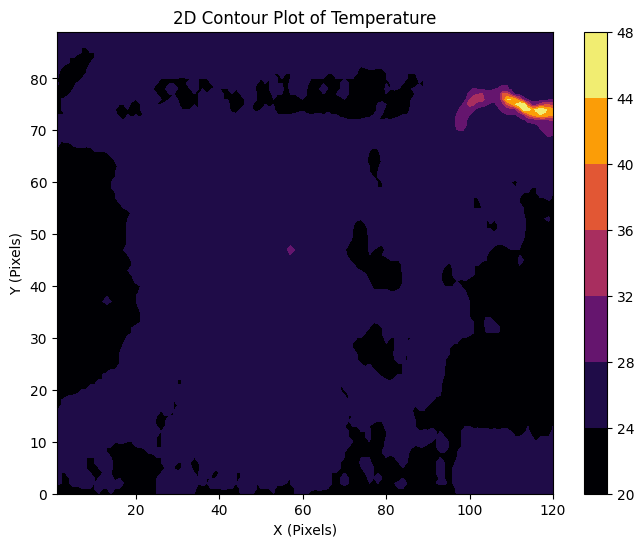

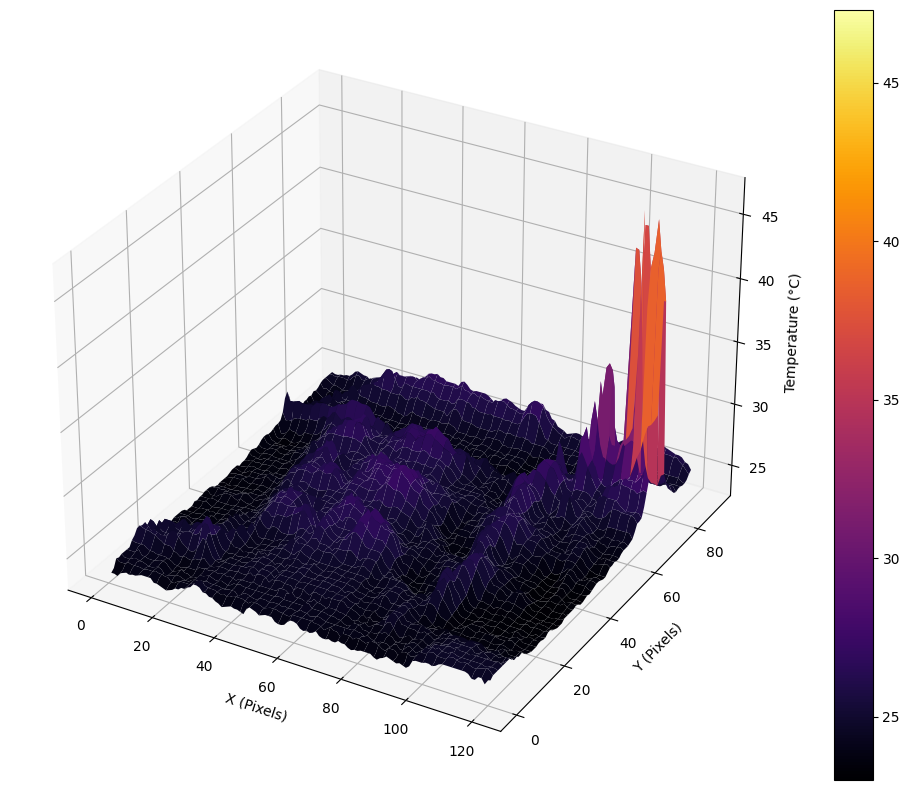



DataFrame 2:



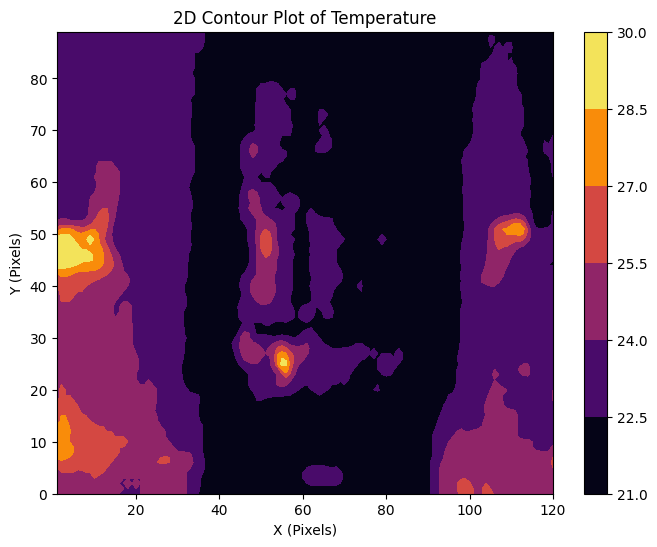

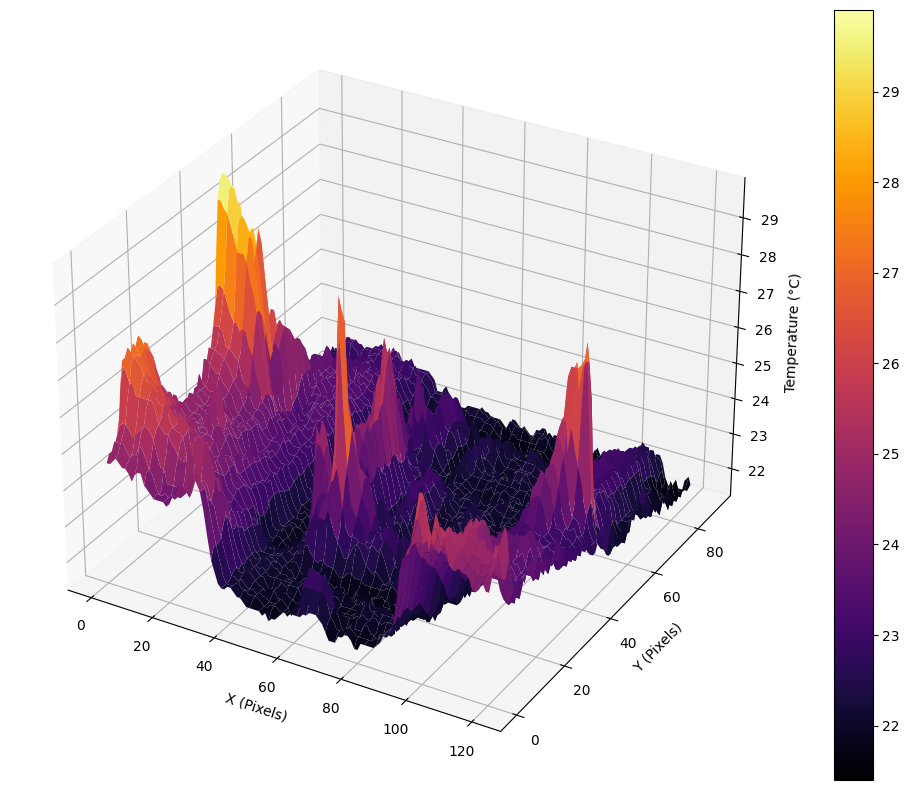



DataFrame 3:



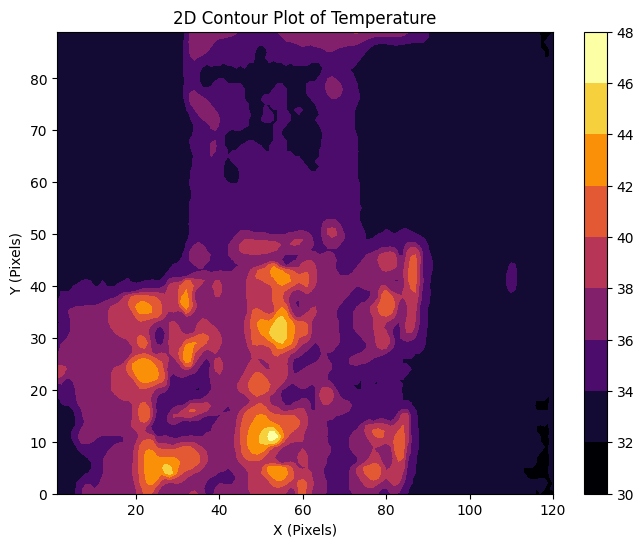

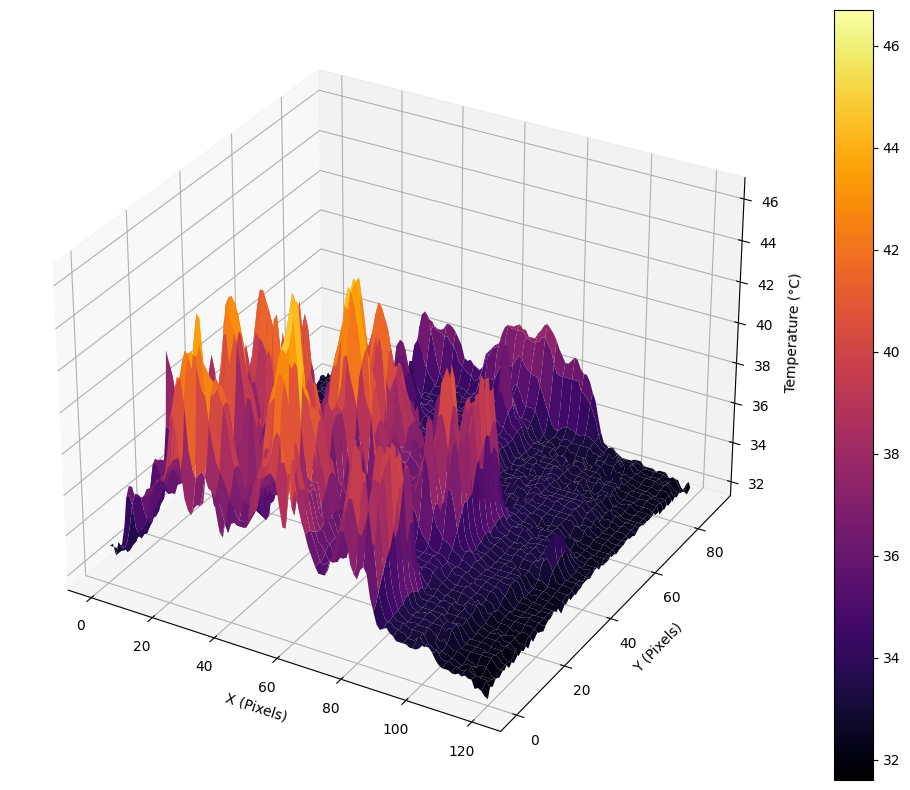



DataFrame 4:



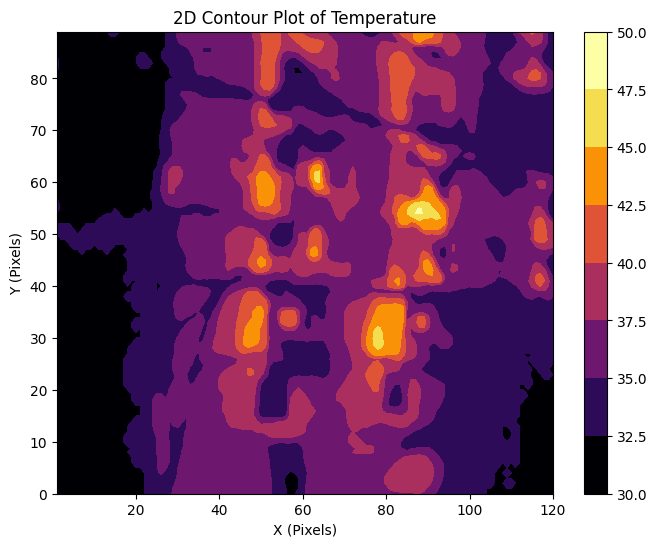

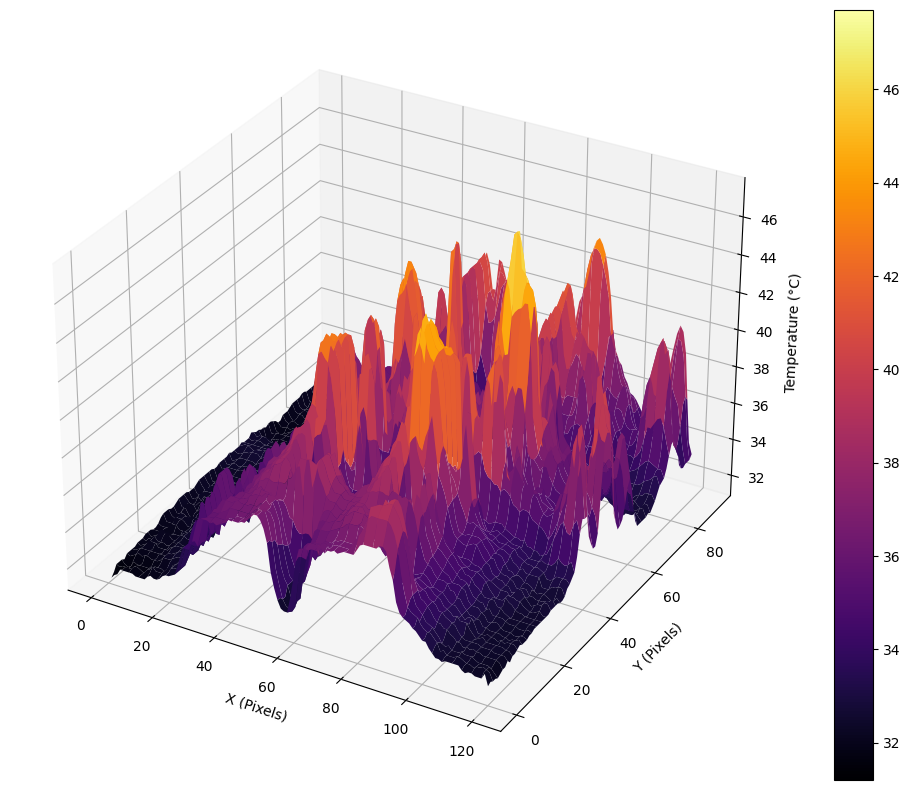



DataFrame 5:



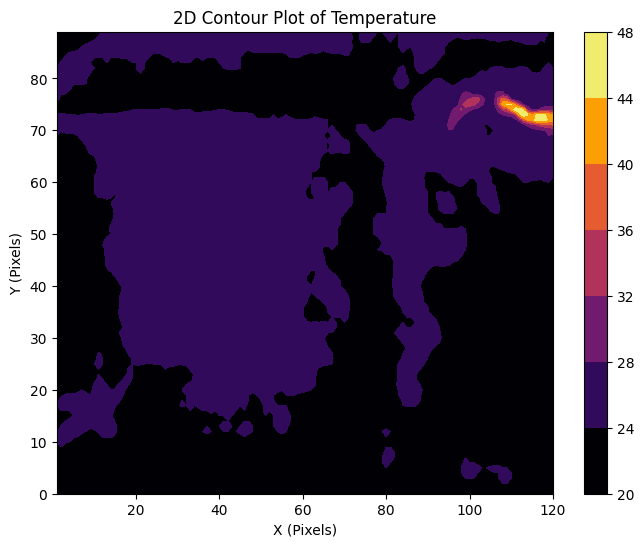

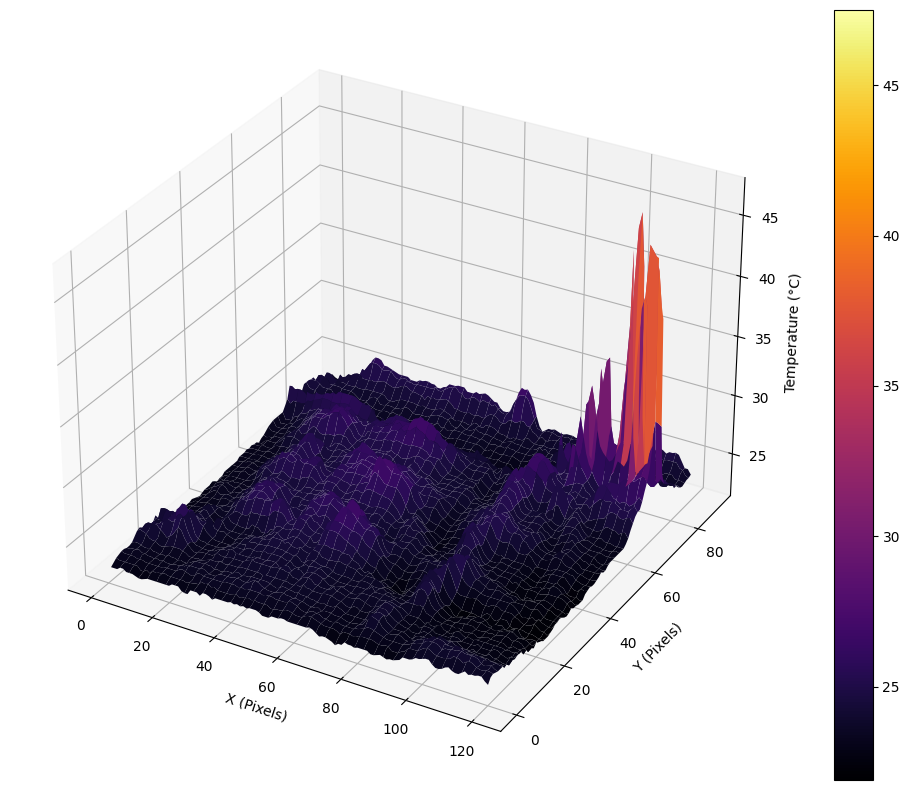

In [ ]:
# Impresión de mapas de superficie con las mediciones de temperatura obtenidas

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Impresión de mapa de contorno en 2D de las temperaturas medidas
    Surf2D(df, X_list[i], Y_list[i], Z_list[i])
    print("\n")

    # Impresión de mapa de superficie en 3D de las temperaturas medidas
    Surf3D(df, X_list[i], Y_list[i], Z_list[i])

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

### **Construcción de Nuevas Características**

El primer paso que se llevará a cabo al realizar la ingeniería de características, corresponde a la construcción de nuevas características con respecto a los conjuntos de datos con los que contamos.

Se decidió generar la siguiente característica, debido a los beneficios y potencial uso que puede brindar a futuro:


1.   Dataframe con banderas binarias (*binary flags*) correspondientes a los valores atípicos o extremos en las mediciones de temperatura

#### **Valores Atípicos o Extremos (Anomalías)**

En primer lugar, se llevó a cabo la generación del dataframe con los valores atípicos, siguiendo la siguiente forma:

**Outlier i,j** =
*   *{1, if Ti,j > Tmean + 3×σ}*
*   *{1, if Ti,j < Tmean - 3×σ}*
*   *{0, otherwise}*

In [ ]:
# Creación de Matriz Binaria relacionada a los valores atípicos con respecto a los límites

# Asignación de valores a las variables para el promedio y desviación estándar de la imagen ejemplo
mean_temp_ex = mean_value_ex
std_temp_ex = std_dev_ex

# Definición de los límites superior e inferior para los valores atípicos
upper_thrs_ex = mean_temp_ex + 3 * std_temp_ex
lower_thrs_ex = mean_temp_ex - 3 * std_temp_ex

# Creación de una matriz binaria
out_ex = pd.DataFrame(np.where((df_examp > upper_thrs_ex) | (df_examp < lower_thrs_ex), 1, 0))

# Visualización de los resultados
print("Datos de Temperatura:\n", df_examp)
print("\nMapa de Valores Atípicos (1 = outlier, 0 = normal):\n", out_ex)

Datos de Temperatura:
      1     2     3     4     5     6     7     8     9     10   ...   111  \
0   37.3  37.1  36.9  36.4  34.7  33.2  32.5  32.4  32.4  32.2  ...  31.4   
1   36.8  36.7  36.6  36.0  34.5  33.3  32.5  32.4  32.4  32.3  ...  31.5   
2   36.0  36.6  36.6  36.4  34.6  33.4  32.6  32.4  32.5  32.5  ...  31.7   
3   37.2  37.5  38.3  37.7  34.8  33.2  32.4  32.5  33.0  33.0  ...  31.8   
4   38.0  38.4  38.6  38.0  34.7  33.0  32.4  32.9  33.5  33.5  ...  31.9   
..   ...   ...   ...   ...   ...   ...   ...   ...   ...   ...  ...   ...   
85  31.7  31.6  31.6  32.3  34.0  35.6  36.7  37.3  37.3  36.2  ...  34.9   
86  32.3  32.6  32.6  33.5  34.8  36.4  37.7  38.2  38.0  36.7  ...  33.7   
87  32.9  33.6  33.9  34.3  35.2  36.6  38.0  38.6  38.2  36.9  ...  33.2   
88  33.6  34.3  34.6  34.9  35.6  36.8  38.1  38.9  38.6  37.3  ...  32.6   
89  33.7  34.8  34.9  35.2  36.0  37.1  38.3  38.9  38.9  37.6  ...  32.4   

     112   113   114   115   116   117   118   119  

Para la generación de esta característica, se hizo uso de los datos previo a que se les aplicaran técnicas de transformación y escalamiento. Esto es debido a que se busca mantener la relación de los comportamientos, además de encontrar los puntos extremos con respecto a la escala correspondiente previa al aplicado de estas técnicas.

### **Estandarización y normalización**

Una vez que se generó un nuevo conjunto de datos con las banderas que corresponden a los puntos de la imagen en temperaturas atípicas o extremas, se llevó a cabo la transformación de los datos.

Esto se llevó a cabo mediante el uso de una estandarización de los datos numéricos y una normalización min-max.

Este proceso se realizó de esta forma para observar el comportamiento de ambos tipos de transformación sobre el conjunto de datos y poder seleccionar el adecuado en preparación para el uso con los modelos de aprendizaje no supervisado.

In [ ]:
# Transformación de datos numéricos

# Asignación de los valores del dataframe a una variable llamada 'temp_ex'
temp_ex = df_examp

# Estandarización de los datos
scaler_std = StandardScaler()
temp_std_ex = scaler_std.fit_transform(temp_ex)

# Normalización Min-Max de los datos
scaler_minmax = MinMaxScaler()
temp_norm_ex = scaler_minmax.fit_transform(temp_ex)

# Convertir de nuevo a DataFrame si es necesario
temp_std_ex = pd.DataFrame(temp_std_ex, columns=temp_ex.columns)
temp_norm_ex = pd.DataFrame(temp_norm_ex, columns=temp_ex.columns)

# Impresión de los resultados
print(temp_std_ex)
print(temp_norm_ex)

         1         2         3         4         5         6         7    \
0   0.197725  0.079043  0.034058  0.009822 -0.286504 -0.949529 -1.392000   
1   0.046147 -0.050300 -0.070438 -0.158558 -0.426641 -0.875667 -1.392000   
2  -0.196378 -0.082636 -0.070438  0.009822 -0.356572 -0.801806 -1.324061   
3   0.167410  0.208387  0.521705  0.557059 -0.216435 -0.949529 -1.459939   
4   0.409935  0.499410  0.626201  0.683344 -0.286504 -1.097251 -1.459939   
..       ...       ...       ...       ...       ...       ...       ...   
85 -1.499951 -1.699430 -1.812036 -1.716078 -0.776985  0.823144  1.461449   
86 -1.318057 -1.376071 -1.463717 -1.210936 -0.216435  1.414034  2.140841   
87 -1.136163 -1.052713 -1.010901 -0.874175  0.063840  1.561757  2.344659   
88 -0.923953 -0.826361 -0.767077 -0.621605  0.344116  1.709480  2.412598   
89 -0.893638 -0.664682 -0.662581 -0.495319  0.624391  1.931064  2.548477   

         8         9         10   ...       111       112       113       114  \
0  -1.

Una vez que se generaron las transformaciones, se imprimen la descripción, valores estadísticos y el dataframe de outliers generado nuevamente, para poder llevar a cabo la selección de la transformación correcta.

In [ ]:
# Impresión de datos estadísticos descriptivos
print(f"Descripción Estadística de los Datos del DataFrame:\n {temp_std_ex.describe()}"+ "\n")

Descripción Estadística de los Datos del DataFrame:
                 1             2             3             4             5    \
count  9.000000e+01  9.000000e+01  9.000000e+01  9.000000e+01  9.000000e+01   
mean   5.329071e-16 -1.845437e-15  9.091493e-16  7.148603e-16  3.261589e-15   
std    1.005602e+00  1.005602e+00  1.005602e+00  1.005602e+00  1.005602e+00   
min   -1.651529e+00 -1.893445e+00 -1.986196e+00 -2.094934e+00 -2.458637e+00   
25%   -9.770058e-01 -1.004209e+00 -1.010901e+00 -8.741753e-01 -7.769853e-01   
50%    1.977254e-01  2.407227e-01  2.082177e-01  3.086975e-02 -7.629715e-02   
75%    8.495117e-01  7.823487e-01  8.003611e-01  8.938197e-01  7.294942e-01   
max    1.501298e+00  1.501822e+00  1.497000e+00  1.693627e+00  2.235974e+00   

                6             7             8             9             10   \
count  9.000000e+01  9.000000e+01  9.000000e+01  9.000000e+01  9.000000e+01   
mean  -7.327472e-16 -3.947460e-17 -1.366808e-15  1.057179e-15  4.587380e-18  

In [ ]:
# Aplanado del Dataframe a una Serie de 1D y conversión a una serie de Pandas
flatdata_std_ex = temp_std_ex.values.flatten()
flatseries_std_ex = pd.Series(flatdata_std_ex)

# Cálculo del máximo, mínimo, promedio, desviación estándar, asímetria y curtosis de las Temperaturas Medidas
max_std_ex = temp_std_ex.max().max()  # Valor Máximo en el DataFrame
min_std_ex = temp_std_ex.min().min()  # Valor Mínimo en el DataFrame
mean_std_ex = temp_std_ex.mean().mean()  # Valor Promedio en el DataFrame
std_std_ex = temp_std_ex.std().mean()  # Desviación Estándar en el DataFrame
skewness_std_ex = flatseries_std_ex.skew() # Asimetría en el DataFrame
kurtosis_std_ex = flatseries_std_ex.kurt() # Curtosis en el DataFrame

# Impresión de Resultados
print(f"Valor Máximo: {max_std_ex}"+ " °C")
print(f"Valor Mínimo: {min_std_ex}"+ " °C")
print(f"Valor Promedio: {mean_std_ex:.2f}"+ " °C")
print(f"Desviación Estándar: {std_std_ex:.2f}")
print(f"Asimetría: {skewness_std_ex:.2f}")
print(f"Curtosis: {kurtosis_std_ex:.2f}")

Valor Máximo: 4.525633724918376 °C
Valor Mínimo: -4.166453499944383 °C
Valor Promedio: 0.00 °C
Desviación Estándar: 1.01
Asimetría: 0.50
Curtosis: -0.20


In [ ]:
# Impresión de datos estadísticos descriptivos
print(f"Descripción Estadística de los Datos del DataFrame:\n {temp_norm_ex.describe()}"+ "\n")

Descripción Estadística de los Datos del DataFrame:
              1          2          3          4          5          6    \
count  90.000000  90.000000  90.000000  90.000000  90.000000  90.000000   
mean    0.523825   0.557672   0.570222   0.552963   0.523715   0.426279   
std     0.318953   0.296178   0.288701   0.265431   0.214204   0.216107   
min     0.000000   0.000000   0.000000   0.000000   0.000000   0.000000   
25%     0.213942   0.261905   0.280000   0.322222   0.358209   0.253968   
50%     0.586538   0.628571   0.630000   0.561111   0.507463   0.380952   
75%     0.793269   0.788095   0.800000   0.788889   0.679104   0.507937   
max     1.000000   1.000000   1.000000   1.000000   1.000000   1.000000   

             7          8          9          10   ...        111        112  \
count  90.000000  90.000000  90.000000  90.000000  ...  90.000000  90.000000   
mean    0.385064   0.305611   0.357598   0.383566  ...   0.311662   0.283979   
std     0.242647   0.257213   0

In [ ]:
# Aplanado del Dataframe a una Serie de 1D y conversión a una serie de Pandas
flatdata_norm_ex = temp_norm_ex.values.flatten()
flatseries_norm_ex = pd.Series(flatdata_norm_ex)

# Cálculo del máximo, mínimo, promedio, desviación estándar, asímetria y curtosis de las Temperaturas Medidas
max_norm_ex = temp_norm_ex.max().max()  # Valor Máximo en el DataFrame
min_norm_ex = temp_norm_ex.min().min()  # Valor Mínimo en el DataFrame
mean_norm_ex = temp_norm_ex.mean().mean()  # Valor Promedio en el DataFrame
std_norm_ex = temp_norm_ex.std().mean()  # Desviación Estándar en el DataFrame
skewness_norm_ex = flatseries_norm_ex.skew() # Asimetría en el DataFrame
kurtosis_norm_ex = flatseries_norm_ex.kurt() # Curtosis en el DataFrame

# Impresión de Resultados
print(f"Valor Máximo: {max_norm_ex}"+ " °C")
print(f"Valor Mínimo: {min_norm_ex}"+ " °C")
print(f"Valor Promedio: {mean_norm_ex:.2f}"+ " °C")
print(f"Desviación Estándar: {std_norm_ex:.2f}")
print(f"Asimetría: {skewness_norm_ex:.2f}")
print(f"Curtosis: {kurtosis_norm_ex:.2f}")

Valor Máximo: 1.0000000000000009 °C
Valor Mínimo: 0.0 °C
Valor Promedio: 0.42 °C
Desviación Estándar: 0.26
Asimetría: 0.39
Curtosis: -1.01


Una vez que se han observado los resultados, se decidió aplicar a los archivos la transformación basada en **Normalización Min-Max**. Esto debido a que no se busca normalizar las distribuciones de los comportamientos en las imágenes, gracias a que la intención es observar y detectar las anomalías.

El estandarizar los datos puede causar que el efecto de estas anomalías no se vea tan significativo al momento de comparar dos instantes de tiempo sobre la misma imagen con diferentes valores obtenidos.

En comparación, al trabajar normalizando los datos con sus mínimos y máximos, brinda una mayor posibilidad de que las relaciones se mantengan al momento de aplicar el modelo de agrupamiento y que las distancias dentro de los *clusters* no se vean afectadas. El tema de los pesos que puedan ser afectados debido al efecto de los valores atípicos, es algo que se deberá tomar en consideración al momento de ejecutar las iteraciones de los modelos de aprendizaje.

### **Selección/Extracción de Características**

Para poder facilitar el proceso de entrenamiento de los modelos de agrupación, se buscará filtrar al dataframe de mediciones de temperatura al obtener los gradientes de cada pixel, considerando su magnitud y dirección.

Esto debido a que un dataframe de gradientes puede mostrar las relaciones de comportamiento en los diferentes grupos de pixeles de mejor manera qué solo las mediciones de temperaturas.

#### **Operaciones con Gradientes**

Además de la característica anterior, se decidió llevar a cabo el cálculo de los gradientes en la imagen.

Esto es debido a que al contar con las magnitudes, direcciones y velocidades (representadas por la varianza) de los gradientes de cada pixel en las imágenes, se pueden realizar muchas inferencias correspondientes al comportamiento de las temperaturas en la imagen, además de brindar un marco de comparación que puede ser útil previo a la definición de modelos de agrupamiento.

In [ ]:
# Operaciones relacionadas con gradientes

# Cálculo de los gradientes en la dirección 'x' (horizontal) y la dirección 'y' (vertical).
grad_x_ex = np.diff(df_examp, axis=1)  # Gradiente a través del eje 'x'
grad_y_ex = np.diff(df_examp, axis=0)  # Gradiente a través del eje 'y'

# Debido a que np.diff reduce las dimensiones del arreglo, se aplica un relleno al resultado (padding) para que coincidan con los tamaños originales
grad_x_ex = np.pad(grad_x_ex, ((0, 0), (0, 1)), mode='edge')  # Padding a la última columna
grad_y_ex = np.pad(grad_y_ex, ((0, 1), (0, 0)), mode='edge')  # Padding a la última fila

# Cálculo de la magnitud y la dirección de los gradientes
grad_mag_ex = np.sqrt(grad_x_ex**2 + grad_y_ex**2)
grad_dir_ex = np.arctan2(grad_y_ex, grad_x_ex) # En radianes, debido al uso de np.arctan2

# Conversión de las direcciones de los gradientes de radianes a grados
grad_dirdeg_ex = np.degrees(grad_dir_ex)

# Ajuste aplicado a las direcciones para que todos los grados sean positivos
grad_dirdeg_ex = (grad_dirdeg_ex + 360) % 360

# Visualización de los resultados
print("Gradiente por Pixel(x):\n", grad_x_ex)
print("\nGradiente por Pixel(y):\n", grad_y_ex)
print("\nMagnitud del Gradiente por Pixel:\n", grad_mag_ex)
print("\nDirección del Gradiente (radianes) por Pixel:\n", grad_dir_ex)
print("\nDirección del Gradiente (grados) por Pixel:\n", grad_dirdeg_ex)

Gradiente por Pixel(x):
 [[-0.2 -0.2 -0.5 ... -0.9  1.1  1.1]
 [-0.1 -0.1 -0.6 ...  0.1  0.4  0.4]
 [ 0.6  0.  -0.2 ...  0.   0.1  0.1]
 ...
 [ 0.7  0.3  0.4 ...  0.1  0.6  0.6]
 [ 0.7  0.3  0.3 ... -0.1  0.6  0.6]
 [ 1.1  0.1  0.3 ...  0.4 -0.3 -0.3]]

Gradiente por Pixel(y):
 [[-0.5 -0.4 -0.3 ...  0.2  1.2  0.5]
 [-0.8 -0.1  0.  ...  0.3  0.2 -0.1]
 [ 1.2  0.9  1.7 ...  0.  -0.1 -0.2]
 ...
 [ 0.7  0.7  0.7 ...  0.2  0.   0. ]
 [ 0.1  0.5  0.3 ...  0.   0.5 -0.4]
 [ 0.1  0.5  0.3 ...  0.   0.5 -0.4]]

Magnitud del Gradiente por Pixel:
 [[0.53851648 0.4472136  0.58309519 ... 0.92195445 1.62788206 1.2083046 ]
 [0.80622577 0.14142136 0.6        ... 0.31622777 0.4472136  0.41231056]
 [1.34164079 0.9        1.71172428 ... 0.         0.14142136 0.2236068 ]
 ...
 [0.98994949 0.76157731 0.80622577 ... 0.2236068  0.6        0.6       ]
 [0.70710678 0.58309519 0.42426407 ... 0.1        0.78102497 0.72111026]
 [1.1045361  0.50990195 0.42426407 ... 0.4        0.58309519 0.5       ]]

Dirección de

Además de realizar el cálculo del gradiente utilizando la función **'np.diff()'**, se realizó el mismo cálculo con la función del filtro Sobel de sciPy.

Esto se llevó a cabo para poder comparar los valores obtenidos entre ambos métodos, lo cual permite tomar una decisión sobre los métodos a aplicar y llevar a cabo.

Este filtro consiste en aplicar una convolución con un par de kernels de 3x3 para encontrar los bordes de las diferentes secciones de la imagen.

In [ ]:
# Gradiente calculado con la función 'sobel()' de SciPy

# Cálculo del gradiente Sobel en las direcciones 'x' y 'y'
grad_x_sobel = sobel(df_examp, axis=1)  # Gradiente Horizontal
grad_y_sobel = sobel(df_examp, axis=0)  # Gradiente Vertical

# Cálculo de la magnitud del gradiente utilizando el Filtro Sobel
grad_mag_sobel = np.sqrt(grad_x_sobel**2 + grad_y_sobel**2)

# Visualización de los resultados
print("Magnitud del Gradiente con Sobel:\n", grad_mag_sobel)

Magnitud del Gradiente con Sobel:
 [[2.02484567 2.12602916 3.13049517 ... 3.84707681 3.28937684 4.580393  ]
 [4.40454311 2.60768096 2.54950976 ... 3.13049517 3.92173431 3.28024389]
 [2.44131112 4.25440948 5.96824932 ... 0.89442719 0.63245553 1.        ]
 ...
 [6.09261848 7.46860094 7.6694198  ... 0.76157731 2.596151   2.54950976]
 [4.81663783 5.93969696 4.70106371 ... 1.1045361  1.96977156 1.65529454]
 [4.07921561 4.80832611 2.28035085 ... 1.         1.         0.76157731]]


Además de lo anterior, se llevaron a cabo algunos cálculos estadísticos con respecto a la magnitud de los gradientes para observar la varianza de las magnitudes, además del valor promedio.

In [ ]:
# Cálculo de Promedio y Varianza de la Magnitud de los Gradientes

# Cálculo de la magnitud promedio de los gradientes
avg_mag_ex = np.mean(grad_mag_ex)
print(f"Promedio de las Magnitudes de los Gradientes: {avg_mag_ex:.4f}")

# Cálculo de la varianza en la magnitud de los gradientes
var_mag_ex = np.var(grad_mag_ex)
print(f"Varianza de las Magnitudes de los Gradientes: {var_mag_ex:.4f}")

Promedio de las Magnitudes de los Gradientes: 0.8670
Varianza de las Magnitudes de los Gradientes: 1.1830


Una vez que se ha obtenido la información anterior, se genera una gráfica conocida como *Histogram of Gradients (HOG)* con respecto a las direcciones de los gradientes, en la cuál se pueden apreciar los patrones de movimiento de los gradientes en la imagen representada.

Es decir, se grafican las frecuencias de las direcciones hacia donde tienden los gradientes en un rango de 360° (0 - 2*pi), para encontrar la dirección hacia donde tienden los cambios de temperatura en la imagen.

Histograma de las Direcciones de Gradientes (Grados):
 [1326  214  201  168  415  180  236  295  210  963  264  246  154  350
  134  217  223  167  983  235  267  189  504  198  237  227  114  555
  156  153  113  195  143  185  208  175]


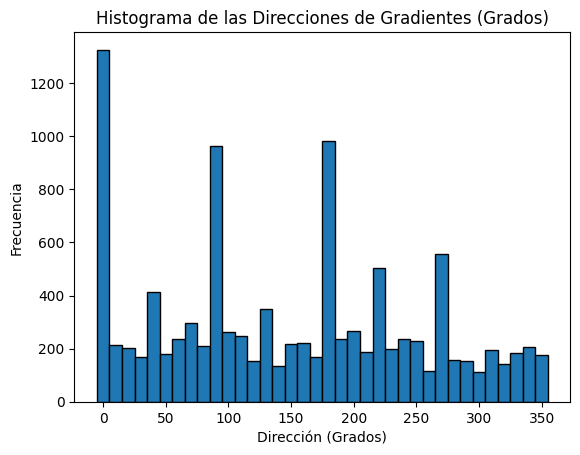

In [ ]:
# Cálculo del Histograma de Gradientes (HOG) con las direcciones de los gradientes

# Definición del número de 'bins'
num_bins = 36  # Para generar intervalos de 10 grados, al estar las direcciones en grados

# Cómputo del histograma de las direcciones de los gradientes
hog_ex, bin_edges = np.histogram(grad_dirdeg_ex, bins=num_bins, range=(0, 360))

# Impresión de los valores del histograma
print("Histograma de las Direcciones de Gradientes (Grados):\n", hog_ex)

# Ploteado del histograma
plt.bar(bin_edges[:-1], hog_ex, width= 10, edgecolor='black')
plt.title('Histograma de las Direcciones de Gradientes (Grados)')
plt.xlabel('Dirección (Grados)')
plt.ylabel('Frecuencia')
plt.show()

Además de esto, se genera una gráfica para visualizar el comportamiento de los gradientes. Esto se lleva a cabo al graficar los valores de las magnitudes y las direcciones en una gráfica, mientras que son representados por flechas que muestren los patrones y tendencias de los gradientes de cada pixel.

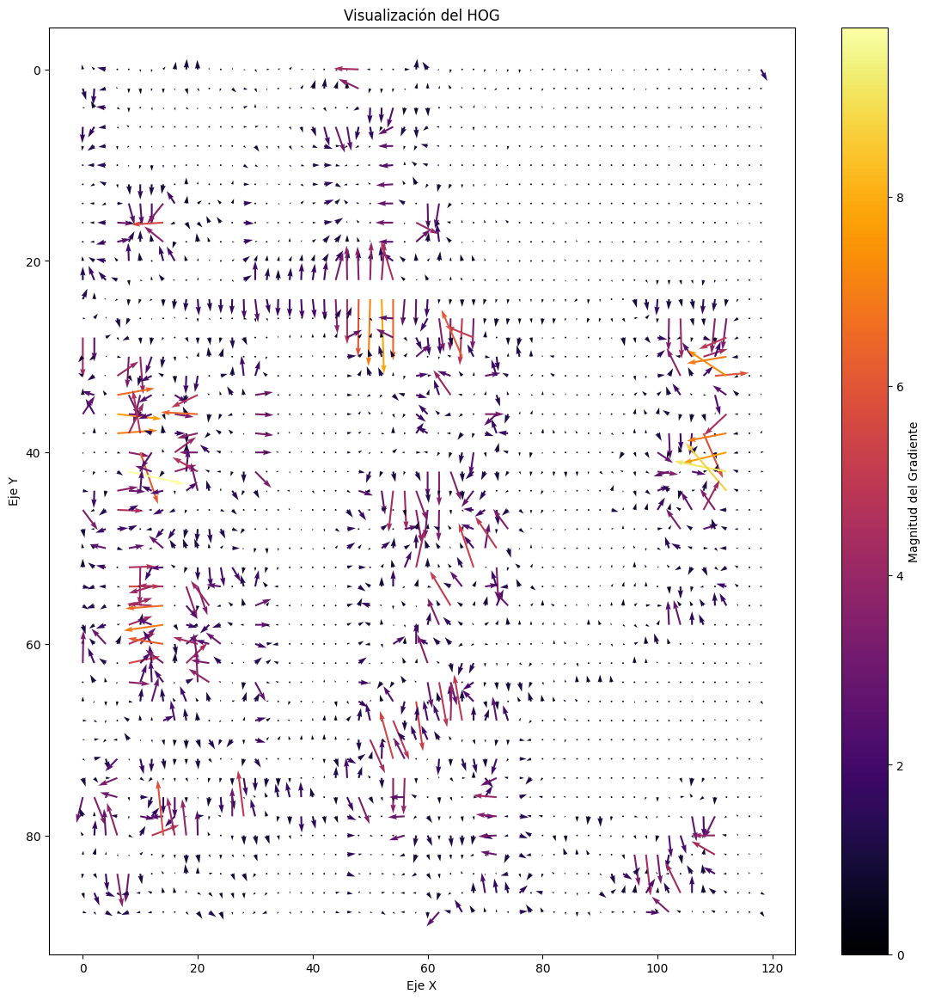

In [ ]:
# Visualización del Histograma de Gradientes

# Conversión de la dirección del gradiente de radianes a sus componentes en 'x' y 'y
# La longitud del vector es proporcional a la magnitud del gradiente

# Dimensiones de la gráfica y del dataframe
height, width = 90, 120

# Definición de las componentes de los vectores a graficar
U = grad_mag_ex * np.cos(grad_dir_ex)  # Componente en X
V = grad_mag_ex * np.sin(grad_dir_ex)  # Componente en Y

# Creación de un grid para el graficado de los vectores
X, Y = np.meshgrid(np.arange(0, width), np.arange(0, height))

# Graficado de las flechas (vectores) del Histograma de Gradientes (HOG)
plt.figure(figsize=(14, 14))

# Submuestreo para una mejor visualización (graficado de cada segundo vector)
step = 2
plt.quiver(X[::step, ::step], Y[::step, ::step], U[::step, ::step], V[::step, ::step],
           grad_mag_ex[::step, ::step], angles='xy', scale_units='xy', scale=1, cmap='inferno')

#plt.quiver(X, Y, U, V, gradient_magnitude, angles='xy', scale_units='xy', scale=1, cmap='inferno')  #Gráfica sin submuestreo

# Personalización de la gráfica
plt.gca().invert_yaxis()  # Inversión del eje 'y' para una orientación correcta
plt.title("Visualización del HOG")
plt.xlabel("Eje X")
plt.ylabel("Eje Y")
plt.colorbar(label="Magnitud del Gradiente")  # Mostrado de la barra de colores para representar las magnitudes
plt.show()

Esta gráfica denota el comportamiento y la tendencia de movimiento de los gradientes de los pixeles en la imagen. El hacer uso de estos dataframes con los gradientes para complementar el proceso de comparación entre diferentes imágenes, puede ser más efectivo que solamente haciendo uso de las mediciones en cada punto.

### **Preparación de Funciones para Aplicación sobre listado de archivos**

In [ ]:
# Creación de Matriz Binaria relacionada a los valores atípicos con respecto a los límites

def outliers (df, mean_value, std_dev):
  # Asignación de valores a las variables para el promedio y desviación estándar de la imagen ejemplo
  mean_temp = mean_value
  std_temp = std_dev

  # Definición de los límites superior e inferior para los valores atípicos
  upper_thrs = mean_temp + 3 * std_temp
  lower_thrs = mean_temp - 3 * std_temp

  # Creación de una matriz binaria
  outliers = pd.DataFrame(np.where((df > upper_thrs) | (df < lower_thrs), 1, 0))

  # Visualización de los resultados
  print("Mapa de Valores Atípicos (1 = outlier, 0 = normal):\n", outliers)

  return outliers

In [ ]:
# Transformación de datos numéricos

def normalization(df):
  # Normalización Min-Max de los datos
  scaler_minmax = MinMaxScaler()
  temp_norm = scaler_minmax.fit_transform(df)

  # Convertir de nuevo a DataFrame si es necesario
  temp_norm = pd.DataFrame(temp_norm, columns=df.columns)

  # Impresión de los resultados
  print("Dataframe Normalizado:\n",temp_norm)

  return temp_norm

In [ ]:
# Operaciones relacionadas con gradientes

def gradient_comps(df):

  # Cálculo de los gradientes en la dirección 'x' (horizontal) y la dirección 'y' (vertical).
  grad_x = np.diff(df, axis=1)  # Gradiente a través del eje 'x'
  grad_y = np.diff(df, axis=0)  # Gradiente a través del eje 'y'

  # Debido a que np.diff reduce las dimensiones del arreglo, se aplica un relleno al resultado (padding) para que coincidan con los tamaños originales
  grad_x = np.pad(grad_x, ((0, 0), (0, 1)), mode='edge')  # Padding a la última columna
  grad_y = np.pad(grad_y, ((0, 1), (0, 0)), mode='edge')  # Padding a la última fila

  # Cálculo de la magnitud y la dirección de los gradientes
  grad_mag = np.sqrt(grad_x**2 + grad_y**2)
  grad_dir = np.arctan2(grad_y, grad_x) # En radianes, debido al uso de np.arctan2

  # Conversión de las direcciones de los gradientes de radianes a grados
  grad_dirdeg = np.degrees(grad_dir)

  # Ajuste aplicado a las direcciones para que todos los grados sean positivos
  grad_dirdeg = (grad_dirdeg + 360) % 360

  # Cálculo de la magnitud promedio de los gradientes
  avg_mag = np.mean(grad_mag)

  # Cálculo de la varianza en la magnitud de los gradientes
  var_mag = np.var(grad_mag)

  # Visualización de los resultados
  print("Gradiente por Pixel(x):\n", grad_x)
  print("\nGradiente por Pixel(y):\n", grad_y)
  print("\nMagnitud del Gradiente por Pixel:\n", grad_mag)
  print("\nDirección del Gradiente (radianes) por Pixel:\n", grad_dir)
  print("\nDirección del Gradiente (grados) por Pixel:\n", grad_dirdeg)
  print(f"\nPromedio de las Magnitudes de los Gradientes: {avg_mag:.4f}")
  print(f"\nVarianza de las Magnitudes de los Gradientes: {var_mag:.4f}")

  return grad_mag, grad_dir, grad_dirdeg

In [ ]:
# Cálculo del Histograma de Gradientes (HOG) con las direcciones de los gradientes

def HOG_dir(grad_dirdeg, bins, bin_width):
  # Cómputo del histograma de las direcciones de los gradientes
  hog, bin_edges = np.histogram(grad_dirdeg, bins=bins, range=(0, 360))

  # Impresión de los valores del histograma
  print("Histograma de las Direcciones de Gradientes (Grados):\n", hog)
  print("\n")

  # Ploteado del histograma
  plt.bar(bin_edges[:-1], hog, width=bin_width, edgecolor='black')
  plt.title('Histograma de las Direcciones de Gradientes (Grados)')
  plt.xlabel('Dirección (Grados)')
  plt.ylabel('Frecuencia')
  plt.show()

In [ ]:
# Visualización del Histograma de Gradientes

def HOV_df(grad_mag, grad_dir, height, width, step):

  # Definición de las componentes de los vectores a graficar
  U = grad_mag * np.cos(grad_dir)  # Componente en X
  V = grad_mag * np.sin(grad_dir)  # Componente en Y

  # Creación de un grid para el graficado de los vectores
  X, Y = np.meshgrid(np.arange(0, width), np.arange(0, height))

  # Graficado de las flechas (vectores) del Histograma de Gradientes (HOG)
  plt.figure(figsize=(14, 14))

  # Submuestreo para una mejor visualización
  plt.quiver(X[::step, ::step], Y[::step, ::step], U[::step, ::step], V[::step, ::step],
           grad_mag[::step, ::step], angles='xy', scale_units='xy', scale=1, cmap='inferno')

  # Personalización de la gráfica
  plt.gca().invert_yaxis()  # Inversión del eje 'y' para una orientación correcta
  plt.title("Visualización del HOG")
  plt.xlabel("Eje X")
  plt.ylabel("Eje Y")
  plt.colorbar(label="Magnitud del Gradiente")  # Mostrado de la barra de colores para representar las magnitudes
  plt.show()

In [ ]:
# Inicialización de listas para almacenar resultados
Outliers = []
Normal_Temp = []
Grad_Mag = []
Grad_Dir = []
Grad_DirDeg = []

In [ ]:
# Impresión de dataframes de valores atípicos y normalizados

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Generación de Dataframe de Valores Atípicos y almacenamiento en la lista correspondiente
    outlier = outliers(df, df.mean().mean(), df.std().mean())
    Outliers.append(outlier)
    print("\n")

    # Normalización de Dataframe y almacenamiento en la lista correspondiente
    temp_norm = normalization(df)
    Normal_Temp.append(temp_norm)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

DataFrame 1:

Mapa de Valores Atípicos (1 = outlier, 0 = normal):
     0    1    2    3    4    5    6    7    8    9    ...  110  111  112  113  \
0     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
1     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
2     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
3     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
4     0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
..  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...  ...   
85    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
86    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
87    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
88    0    0    0    0    0    0    0    0    0    0  ...    0    0    0    0   
89    0    0    0    0    0    0    0    0

In [ ]:
# Impresión de operaciones de gradientes de los dataframes

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Operaciones con Gradientes y almacenamiento en la lista correspondiente
    grad_mag, grad_dir, grad_dirdeg = gradient_comps(df)
    Grad_Mag.append(grad_mag)
    Grad_Dir.append(grad_dir)
    Grad_DirDeg.append(grad_dirdeg)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

DataFrame 1:

Gradiente por Pixel(x):
 [[ 0.  -0.1  0.3 ... -0.4  0.4  0.4]
 [ 0.   0.   0.1 ... -0.1 -0.3 -0.3]
 [-0.2  0.   0.  ... -0.1 -0.3 -0.3]
 ...
 [ 0.  -0.1  0.  ... -0.3 -0.3 -0.3]
 [ 0.  -0.1  0.1 ... -0.3 -0.3 -0.3]
 [-0.1  0.   0.1 ... -0.1 -0.4 -0.4]]

Gradiente por Pixel(y):
 [[ 0.2  0.2  0.3 ...  0.2  0.5 -0.2]
 [ 0.6  0.4  0.4 ...  0.2  0.2  0.2]
 [-0.1  0.   0.  ... -0.2  0.   0. ]
 ...
 [ 0.   0.   0.  ...  0.3  0.3  0.3]
 [ 0.  -0.1  0.  ...  0.1  0.3  0.2]
 [ 0.  -0.1  0.  ...  0.1  0.3  0.2]]

Magnitud del Gradiente por Pixel:
 [[0.2        0.2236068  0.42426407 ... 0.4472136  0.64031242 0.4472136 ]
 [0.6        0.4        0.41231056 ... 0.2236068  0.36055513 0.36055513]
 [0.2236068  0.         0.         ... 0.2236068  0.3        0.3       ]
 ...
 [0.         0.1        0.         ... 0.42426407 0.42426407 0.42426407]
 [0.         0.14142136 0.1        ... 0.31622777 0.42426407 0.36055513]
 [0.1        0.1        0.1        ... 0.14142136 0.5        0.4472136 ]]

DataFrame 1:

Histograma de las Direcciones de Gradientes (Grados):
 [2113  145  206   96  661  124  199  231   58 1326  275  218  107  356
   87  181  149   25  939  122  146   97  490  113  155  143   31  920
  151  163   77  304   68  161  141   22]




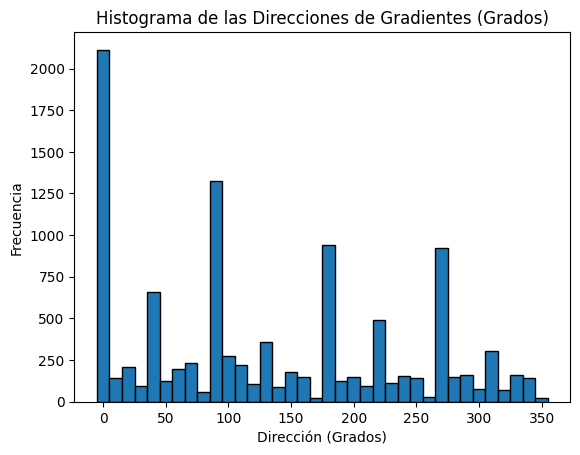





DataFrame 2:

Histograma de las Direcciones de Gradientes (Grados):
 [2751  112  149   40  467   24   97   49   13 1021   99  144   48  383
   48  169  110   13 1466  165  239   85  745   73  169   82   22 1035
   45  127   28  354   68  165  165   30]




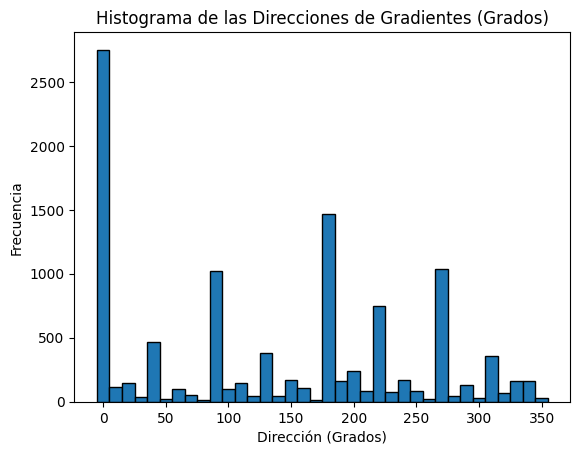





DataFrame 3:

Histograma de las Direcciones de Gradientes (Grados):
 [2585  168  160  116  415  103  137   89   49  894  187  226  117  248
   85  156  151   66 1176  146  155  119  629  112  162  138   67  912
  144  160   98  266  119  179  180   86]




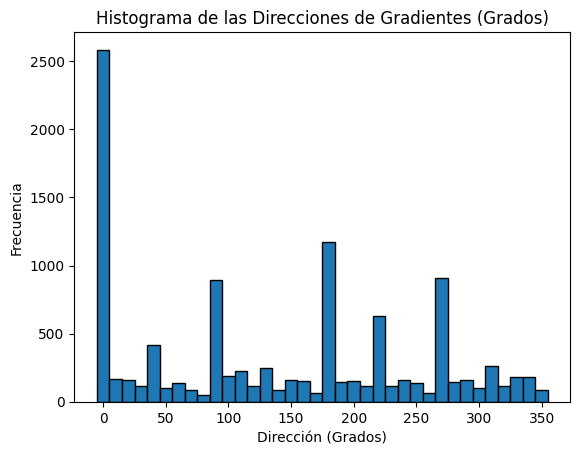





DataFrame 4:

Histograma de las Direcciones de Gradientes (Grados):
 [2133  227  202  128  581  139  209  187  124  956  174  173  135  273
  106  215  157   94  989  170  150  149  483  140  160  157   89  694
  141  137  122  281  130  199  225  171]




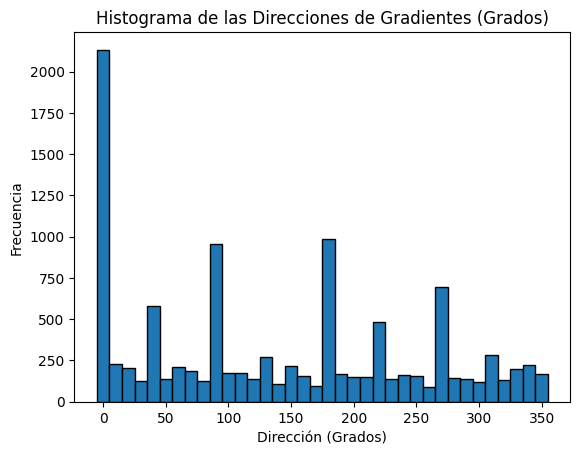





DataFrame 5:

Histograma de las Direcciones de Gradientes (Grados):
 [1940  153  192   85  714  145  270  212   48 1469  244  215   95  454
   67  170  136   13  926  109  166   90  530  121  186  172   51  851
  147  154   69  278   68  119  117   24]




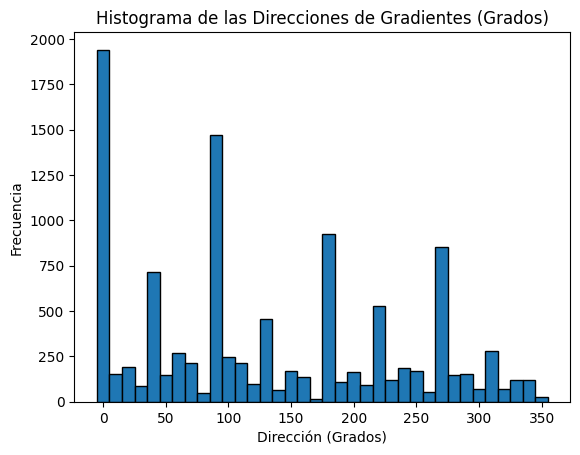

In [ ]:
# Impresión de histogramas de las direcciones de los gradientes de los dataframes

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Graficado de los Histogramas de las Direcciones de Gradientes
    HOG_dir(Grad_DirDeg[i], num_bins, 10)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

DataFrame 1:



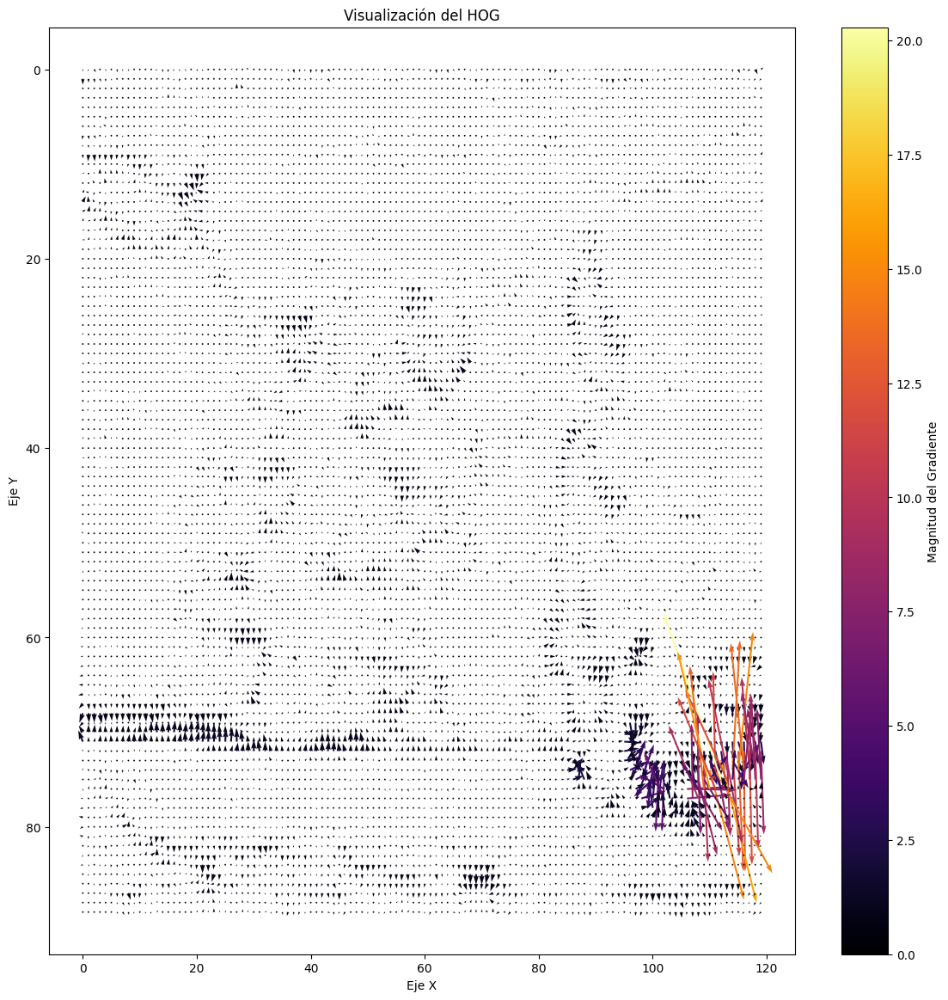





DataFrame 2:



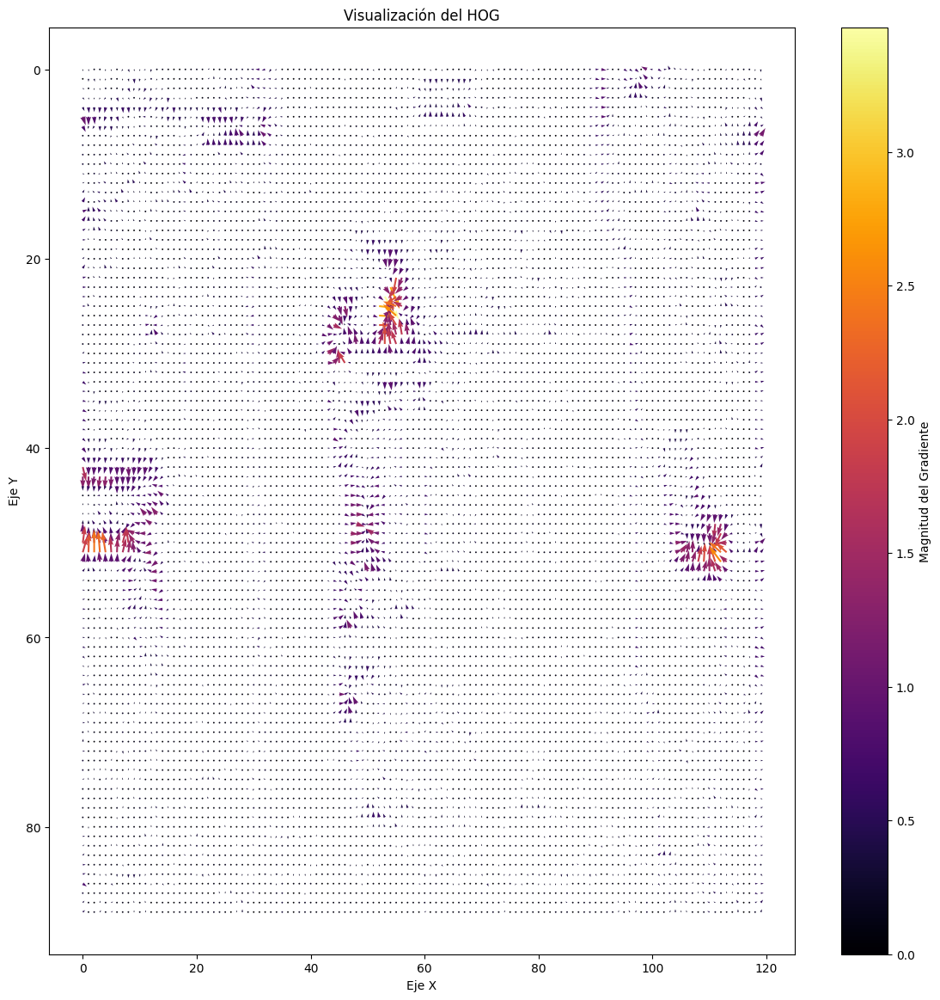





DataFrame 3:



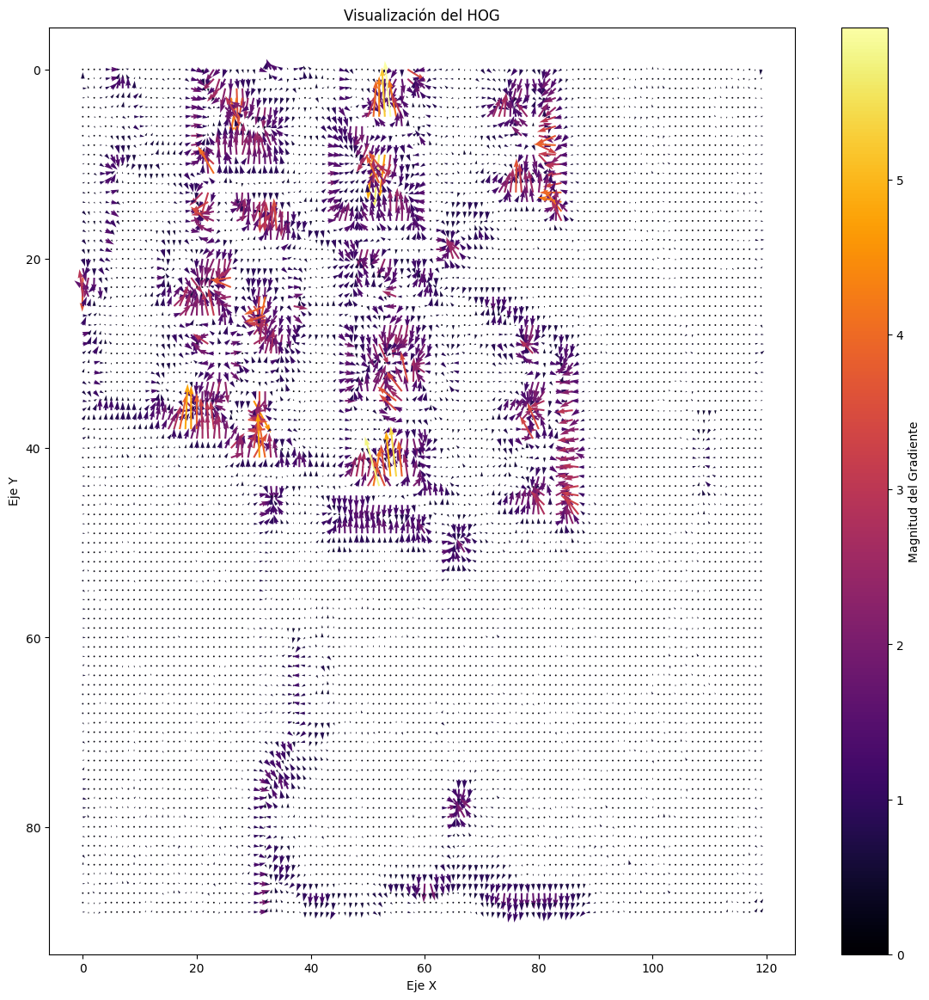





DataFrame 4:



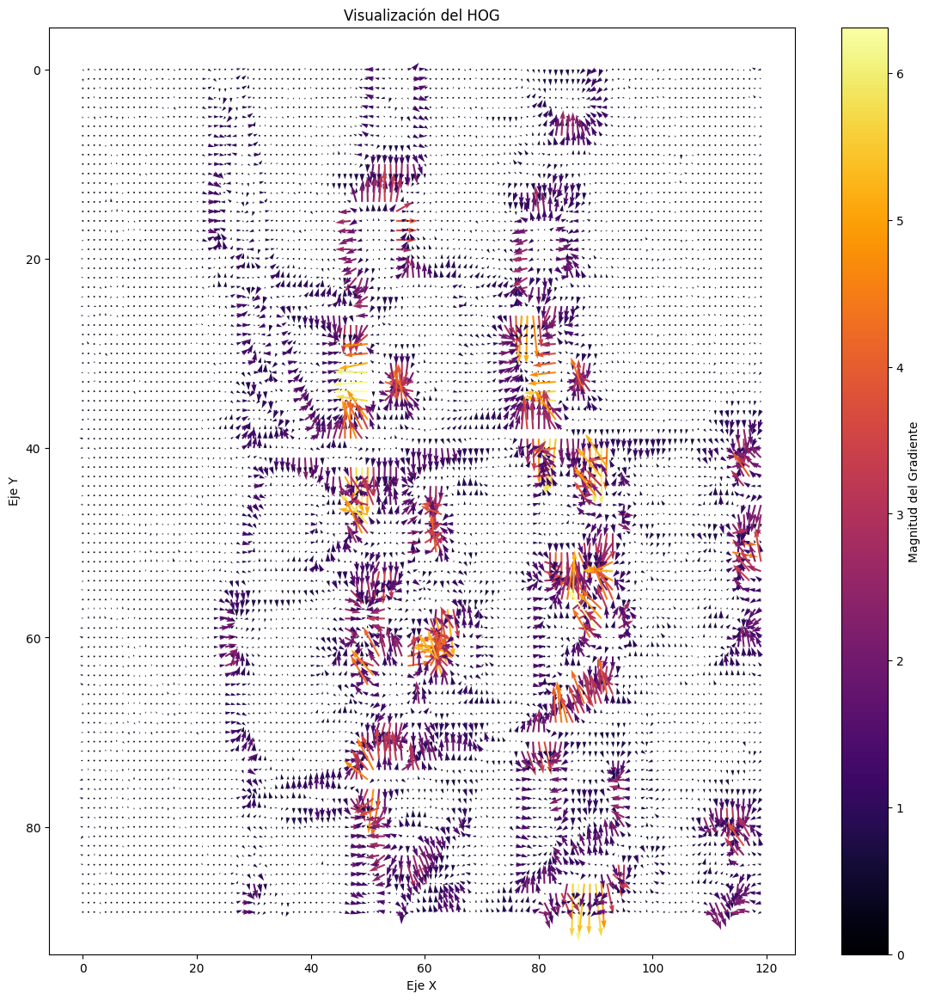





DataFrame 5:



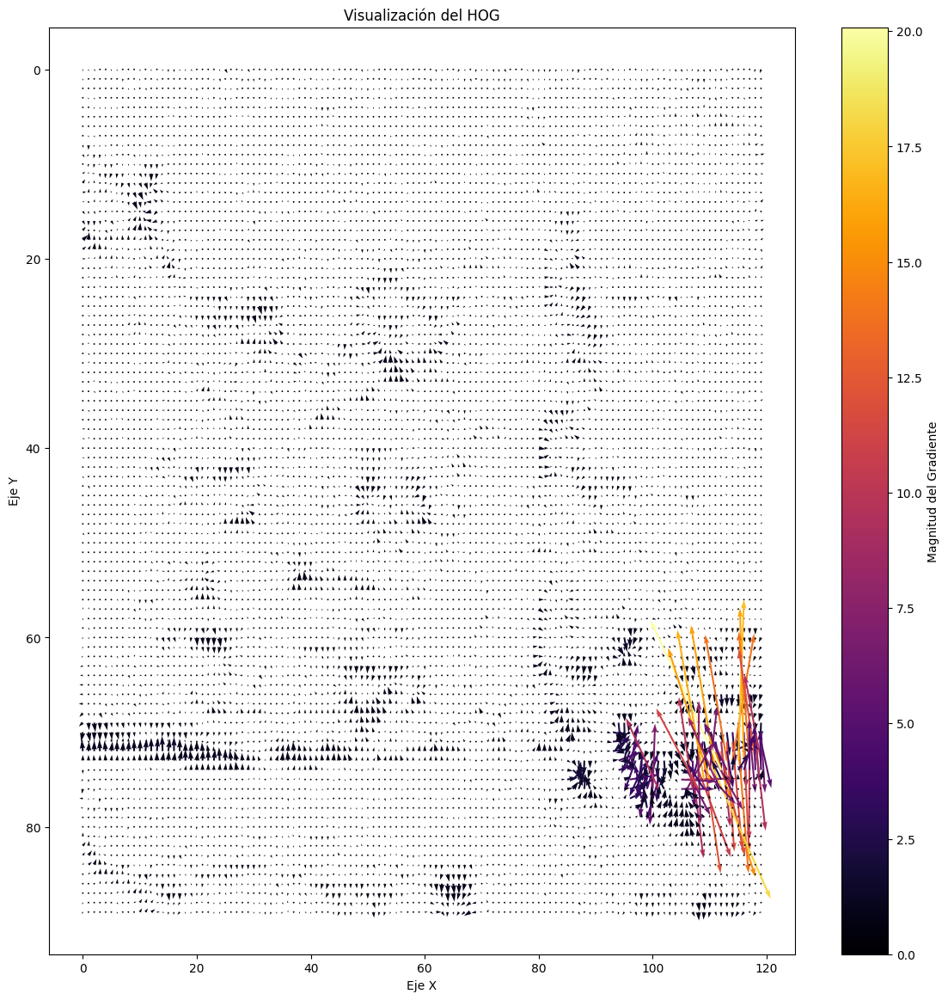

In [ ]:
# Impresión de las visualizaciones de los HOG de los dataframes

# Iteración de los primeros 5 Dataframes
for i, df in enumerate(processed_dataframes[:5]):

    # Impresión del número de DataFrame
    print(f"DataFrame {i+1}:"+ "\n")

    # Visualización del HOG del Dataframe
    HOV_df(Grad_Mag[i], Grad_Dir[i], 90, 120, 1)
    print("\n")

    # Separador entre los Dataframes para mejor lectura
    print("\n" + "="*80 + "\n")

## **Conclusiones**

La identificación de anomalías en imágenes termográficas es un desafío crítico en la monitorización industrial. Este proyecto se propuso abordar esta necesidad utilizando dos enfoques: uno supervisado y otro no supervisado. Cada enfoque ofrece ventajas únicas y puede complementar el proceso de detección de anomalías.

Se realizó un análisis exhaustivo de los datos termográficos, identificando características clave que son diferentes para cada enfoque. En el caso del modelo supervisado, se utilizaron imágenes que fueron etiquetadas para obtener la posición de los elementos dentro de la imagen. La correcta selección y etiquetado de estas imágenes son fundamentales para el rendimiento del modelo, ya que un mal etiquetado puede llevar a un aprendizaje ineficaz y a un desempeño deficiente en la generalización a nuevos datos.

Por otro lado, el método no supervisado permitió obtener nuevas características, como el cálculo de los valores atípicos. A partir de estos, se generó una matriz que puede ser utilizada en el modelo como una máscara, ayudando a identificar áreas de interés en las imágenes. Además de esto, para preparar los datos se realizó una estandarización y normalización Min-Max. Estos procesos son beneficiosos porque permiten que los datos se ajusten a un rango específico, mejorando la convergencia del modelo y garantizando que todas las características tengan la misma importancia durante el entrenamiento.

Se llevó a cabo un filtrado para obtener los gradientes de cada pixel, lo que resalta las transiciones y los cambios en la temperatura. Este enfoque funciona como un filtro que mejora la detección de patrones en los datos. Al simplificar los datos o agregar características relevantes, se proporciona una representación más clara y manejable del problema, lo que permite a los modelos ser más precisos. Al reducir el ruido y enfatizar las características significativas, los modelos pueden enfocarse en patrones importantes y aprender de manera más efectiva, resultando en un mejor desempeño.

En conclusión, la ingeniería de características desempeña un papel fundamental en el análisis de variables y en la preparación del dataset para el modelo. Al identificar y transformar adecuadamente las características relevantes, se logra un entrenamiento más eficiente, lo que potencialmente se traduce en una mayor precisión y efectividad en la detección de anomalías.